In [1]:
import sys
print(sys.version)

3.10.0 | packaged by conda-forge | (default, Nov 10 2021, 13:20:59) [MSC v.1916 64 bit (AMD64)]


In [2]:
import os
import numpy as np
import pandas as pd
import scipy.sparse as sparse

import scanpy as sc
from anndata import AnnData
import anndata

import matplotlib.pyplot as plt
import seaborn as sns

sc.logging.print_header()
# sc.logging.print_versions()
sc.set_figure_params(facecolor="white", figsize=(8, 8))
sc.settings.verbosity = 3 # errors (0), warnings (1), info (2), hints (3)

sns.set_style("white")

np.random.seed(0)

scanpy==1.8.2 anndata==0.7.8 umap==0.5.2 numpy==1.21.5 scipy==1.8.0 pandas==1.4.1 scikit-learn==1.0.2 statsmodels==0.13.2 python-igraph==0.9.9 pynndescent==0.5.6


## Load Slide-seq Dataset

In [3]:
filepath = os.path.join("data", "slide_seq", "v1")
gcm_filename = "MappedDGEForR.csv"
locations_filename = "BeadLocationsForR.csv"
adata_filename = "slideseqv1_cerebellum_adataraw.h5ad"

if os.path.isfile(os.path.join(filepath, adata_filename)):
    
    # read existing anndata if present in folder
    # ------------------------------------------
    
    adata = anndata.read_h5ad(os.path.join(filepath, adata_filename))
    
else:
    
    # read raw text files and convert to anndata
    # ------------------------------------------
    
    gcm_df = pd.read_csv(os.path.join(filepath, gcm_filename), index_col = 0)
    locations_df = pd.read_csv(os.path.join(filepath, locations_filename), index_col = 0)
    display(gcm_df, locations_df)

    sparse_X = sparse.csc_matrix(gcm_df.values.T)
    display(sparse_X)
    
    adata = AnnData(X = sparse_X, 
                    obs = locations_df, 
                    var = pd.DataFrame(index = gcm_df.index))
    
    adata.write(os.path.join(filepath, adata_filename))

    
print(f"Matrix sparsity: {adata.X.nnz} filled elements "
      f"({adata.X.nnz/adata.X.shape[0]/adata.X.shape[1]:0.2f}) "
      f"out of {adata.X.shape[0]*adata.X.shape[1]}\n"
      f"max: {np.amax(adata.X.data)}, min: {np.amin(adata.X.data)}")

# y and x locations / coordinates
# -------------------------------

raw_y, raw_x = adata.obs["ycoord"], adata.obs["xcoord"]
adata.obsm["coord_xy"] = np.vstack((adata.obs["xcoord"].values,adata.obs["ycoord"].values)).T

display(
    adata, 
    #adata.obs, 
    #adata.var
)

Matrix sparsity: 2555142 filled elements (0.01) out of 477062721
max: 522.0, min: 1.0


AnnData object with n_obs × n_vars = 25551 × 18671
    obs: 'xcoord', 'ycoord'
    obsm: 'coord_xy'

### Calculate QC metrics

In [4]:
adata.var_names_make_unique()
adata.var["mt"] = adata.var_names.str.startswith("MT-")
sc.pp.calculate_qc_metrics(adata, qc_vars=["mt"], inplace=True)

# display(adata.obs, adata.var)

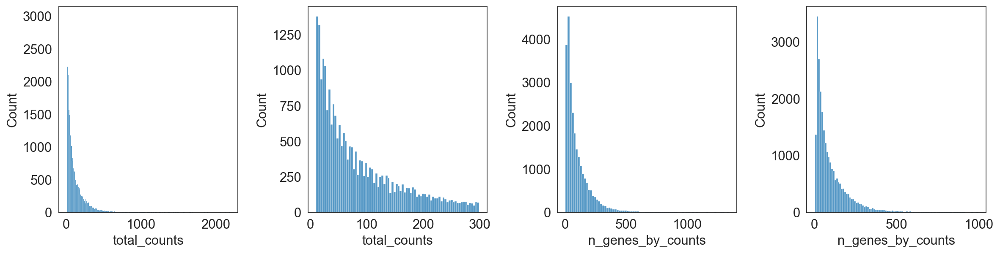

In [5]:
fig, axs = plt.subplots(1, 4, figsize=(15, 4))
sns.histplot(adata.obs["total_counts"], kde=False, ax=axs[0])
sns.histplot(adata.obs["total_counts"][adata.obs["total_counts"] < 300], kde=False, bins=80, ax=axs[1])
sns.histplot(adata.obs["n_genes_by_counts"], kde=False, bins=80, ax=axs[2])
sns.histplot(adata.obs["n_genes_by_counts"][
    (adata.obs["n_genes_by_counts"] < 1000) & (adata.obs["n_genes_by_counts"] > 0)
], kde=False, bins=100, ax=axs[3])
fig.tight_layout()

filtered out 3343 cells that have less than 20 counts
filtered out 80 cells that have more than 1000 counts
#cells after count filter: 22128
#cells after MT filter: 22128
filtered out 6681 genes that are detected in less than 10 cells


Trying to set attribute `.var` of view, copying.


#genes after minimum cells per gene filter: 11990


AnnData object with n_obs × n_vars = 22128 × 11990
    obs: 'xcoord', 'ycoord', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_counts'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    obsm: 'coord_xy'

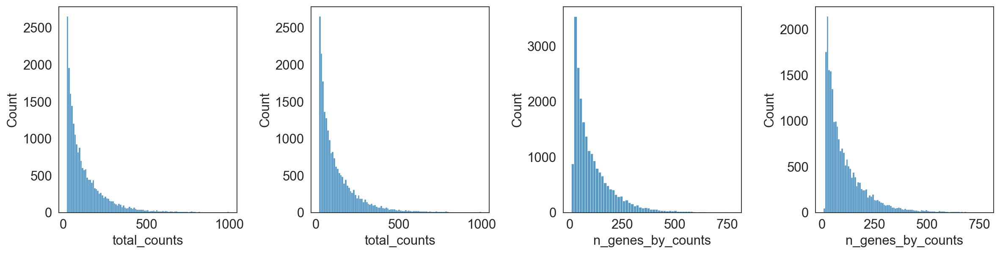

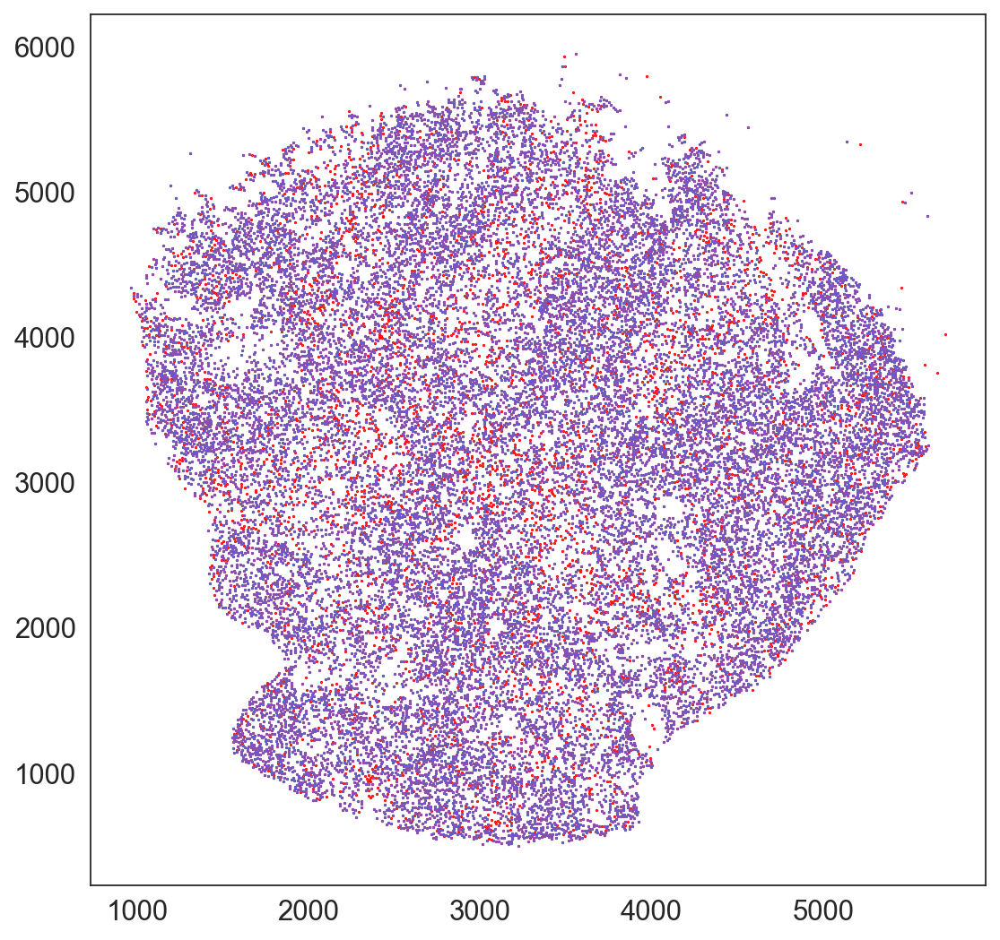

In [6]:
sc.pp.filter_cells(adata, min_counts=20)
sc.pp.filter_cells(adata, max_counts=1000)
print(f"#cells after count filter: {adata.n_obs}")

adata = adata[adata.obs["pct_counts_mt"] < 20]
print(f"#cells after MT filter: {adata.n_obs}")

sc.pp.filter_genes(adata, min_cells=10)
print(f"#genes after minimum cells per gene filter: {adata.n_vars}")

fig, axs = plt.subplots(1, 4, figsize=(15, 4))
sns.histplot(adata.obs["total_counts"], kde=False, ax=axs[0])
sns.histplot(adata.obs["total_counts"][adata.obs["total_counts"] < 2000], kde=False, bins=100, ax=axs[1])
sns.histplot(adata.obs["n_genes_by_counts"], kde=False, bins=60, ax=axs[2])
sns.histplot(adata.obs["n_genes_by_counts"][adata.obs["n_genes_by_counts"] < 2000], kde=False, bins=100, ax=axs[3])
fig.tight_layout()

# Filter out beads outside the puck
# puck_center = (3330,3180) # (x,y)
# puck_radius = 2550
# puck_mask = np.sqrt((adata.obs["ycoord"] - puck_center[1])**2 + (adata.obs["xcoord"] - puck_center[0])**2) < puck_radius
# adata = adata[puck_mask,:]
# circle = plt.Circle(puck_center, puck_radius, color='g', fill=False)

fig, ax = plt.subplots(figsize = (8,8))
ax.scatter(raw_x, raw_y, s = 0.2, c = "red")
ax.scatter(adata.obs["xcoord"], adata.obs["ycoord"], s = 0.2, c = "slateblue")
# ax.add_patch(circle)

adata

## Normalize / Filter highly variable genes (HVG)

We can use the **raw count data** (flavour = `"seurat_v3"`) or **log-transformed data** (flavour = `"seurat"`)

In [7]:
# from skmisc.loess import loess
# import skmisc.loess.loess as loess
# import skmisc.loess

def print_max_min(anndata: anndata.AnnData):
    print(f"\nMax: {anndata.X.max()}, Min: {anndata.X.min()}\n")

n_top_genes = 2000
filter_by_HVG = True
# hvg_type = "seurat_v3"
hvg_type = "seurat"

# create a copy that will be log-transformed for old seurat version of HVG
adata_log1p = adata.copy()


# HVG detection on raw count data (seurat v3)
# ----------------------------------------------

# print("---- Raw data ----")
# print_max_min(adata)
# sc.pp.highly_variable_genes(adata, 
#                             flavor="seurat_v3", 
#                             n_top_genes=n_top_genes)

# # normalize by total cell count
sc.pp.normalize_total(adata, inplace = True)
print("--- Normalized data -----")
print_max_min(adata)


# HVG detection on log-transformed data (old seurat)
# --------------------------------------------------

sc.pp.normalize_total(adata_log1p, inplace = True)
sc.pp.log1p(adata_log1p)
print("--- Normalized and log-transformed data -----")
print_max_min(adata_log1p)

sc.pp.highly_variable_genes(adata_log1p, 
                            flavor="seurat", 
                            n_top_genes=n_top_genes)

# Compare
# -------

# print(adata_log1p.var["highly_variable"], )
# print(f"\nOverlap between seurat method (on log transformed data)"
#       f" and seurat v3 method (on raw count data):"
#       f"{(adata.var['highly_variable'] & adata_log1p.var['highly_variable']).sum()}")

# display(adata)
# display(adata_log1p)

# print("----- Top Genes, Seurat v3 -----")
# display(adata.var[adata.var["highly_variable_rank"]<10])
# print("----- Top Genes, Seurat -----")
# display(adata_log1p.var[adata_log1p.var["highly_variable_rank"]<10])

# Filter out non-highly variable genes
# ------------------------------------

if filter_by_HVG:
    
    if hvg_type == "seurat_v3":
        hvg_filter = adata.var["highly_variable"]
    elif hvg_type == "seurat":
        hvg_filter = adata_log1p.var["highly_variable"]
    else:
        raise ValueError("hvg_type not recognised")
    
    # save a copy of the unfiltered
    adata_allgenes = adata.copy()
    
    adata = adata[:, hvg_filter]
    display(adata)

normalizing counts per cell
    finished (0:00:00)
--- Normalized data -----

Max: 60.51852035522461, Min: 0.0

normalizing counts per cell
    finished (0:00:00)
--- Normalized and log-transformed data -----

Max: 4.119338035583496, Min: 0.0

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


View of AnnData object with n_obs × n_vars = 22128 × 2000
    obs: 'xcoord', 'ycoord', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_counts'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    obsm: 'coord_xy'

### Check genes and cells annotations

after basic filtering steps and HVG analysis

In [8]:
# show annotation dataframes
# --------------------------

print("\n  Genes Info\n" + "=" * 20 )
display(adata.var)
print("\n  Cells Info\n" + "=" * 20 )
display(adata.obs)

# Check data matrix
# -----------------

display(adata.X)
print(f"Matrix sparsity: {adata.X.nnz} filled elements "
      f"({adata.X.nnz/adata.X.shape[0]/adata.X.shape[1]:0.2f}) "
      f"out of {adata.X.shape[0]*adata.X.shape[1]}")



  Genes Info


,mt,n_cells_by_counts,mean_counts,log1p_mean_counts,pct_dropout_by_counts,total_counts,log1p_total_counts,n_cells
Row,,,,,,,,
0610009L18Rik,False,67,0.002779,0.002775,99.737779,71.0,4.276666,65
0610037L13Rik,False,232,0.009628,0.009582,99.092012,246.0,5.509388,222
0610040J01Rik,False,28,0.001213,0.001213,99.890415,31.0,3.465736,25
1010001B22Rik,False,15,0.000626,0.000626,99.941294,16.0,2.833213,15
1110002L01Rik,False,24,0.000939,0.000939,99.906070,24.0,3.218876,23
...,...,...,...,...,...,...,...,...
mt-Tm,False,718,0.029236,0.028816,97.189934,747.0,6.617403,681
mt-Tq,False,351,0.014285,0.014184,98.626277,365.0,5.902633,336
mt-Tr,False,152,0.006027,0.006009,99.405111,154.0,5.043425,149



  Cells Info


,xcoord,ycoord,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,total_counts_mt,log1p_total_counts_mt,pct_counts_mt,n_counts
barcodes,,,,,,,,,,,,,,
TACTAAAGAATTA,2224.000000,1230.397849,35,3.583519,39.0,3.688879,100.000000,100.000000,100.000000,100.0,0.0,0.0,0.0,39.0
TCTCTTAGTTGGC,1914.742424,2221.954545,33,3.526361,38.0,3.663562,100.000000,100.000000,100.000000,100.0,0.0,0.0,0.0,38.0
GCTTTTCGTTCCC,1682.151515,3886.575758,57,4.060443,63.0,4.158883,88.888889,100.000000,100.000000,100.0,0.0,0.0,0.0,63.0
GTACCCTTCCGGG,3913.880342,1899.717949,283,5.648974,345.0,5.846439,32.463768,46.956522,75.942029,100.0,0.0,0.0,0.0,345.0
TGGCCCTTGGAAC,1687.000000,3896.016393,266,5.587249,297.0,5.697093,27.272727,44.107744,77.777778,100.0,0.0,0.0,0.0,297.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CTACCGTGCGGCG,5176.223776,3567.398601,30,3.433987,33.0,3.526361,100.000000,100.000000,100.000000,100.0,0.0,0.0,0.0,33.0
CCGATATGCGGCG,2222.324324,3906.189189,48,3.891820,49.0,3.912023,100.000000,100.000000,100.000000,100.0,0.0,0.0,0.0,49.0
TTGGTATCGCCGC,3187.536082,2031.268041,55,4.025352,58.0,4.077538,91.379310,100.000000,100.000000,100.0,0.0,0.0,0.0,58.0


<22128x2000 sparse matrix of type '<class 'numpy.float32'>'
	with 278503 stored elements in Compressed Sparse Column format>

Matrix sparsity: 278503 filled elements (0.01) out of 44256000


## Generate spatial weights graph

- Edges / connections in the graph represent neighbour relationships between cells

    1. fix number of neighbours `num_neighbours`
    
    2. fix spatial width for choosing neighbours, using gaussian decay from cell location with $\sigma$ = `sigma` and cutoff radius by `p_outside` of a normalized gaussian probablility distribution with the same `sigma`
    
    
- Connections are weighted in various ways

    1. can be unweighted
    
    2. can be weighted by distance (closer higher), either using gauissan decay or $\frac{1}{r}$
    
    
- *optional*: **Visualize weights** by plotting the connections. Line thickness is proportional to edge weight (normalized by highest weight across all edges)


Median distance to closest cell = 16.62498855651838

---- Ran generate_spatial_distance_graph in 0.13 s ----

---- Ran row_normalize in 0.12 s ----

---- Ran generate_spatial_weights_fixed_nbrs in 0.27 s ----


Edge weights (distances between cells): median = 34.01239683706183, mode = 28.901124512552187

---- Ran plot_edge_histogram in 0.07 s ----


Edge weights (weights between cells): median = 0.08644132066346874, mode = 0.06522958058038052

---- Ran plot_edge_histogram in 0.07 s ----

{-1: {'weights': <22128x22128 sparse matrix of type '<class 'numpy.float64'>'
	with 221280 stored elements in Compressed Sparse Row format>}}
Maximum weight: 0.8054573036604421

---- Ran plot_graph_weights in 3.19 s ----



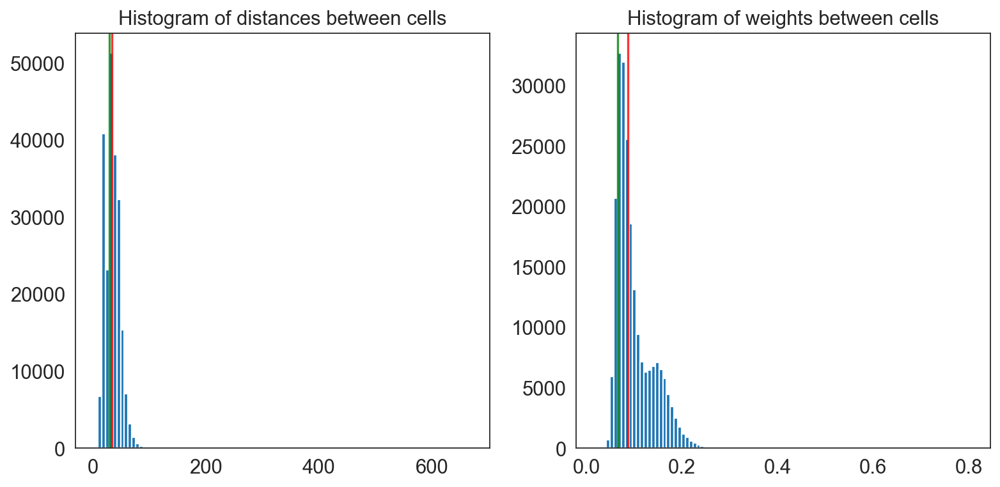

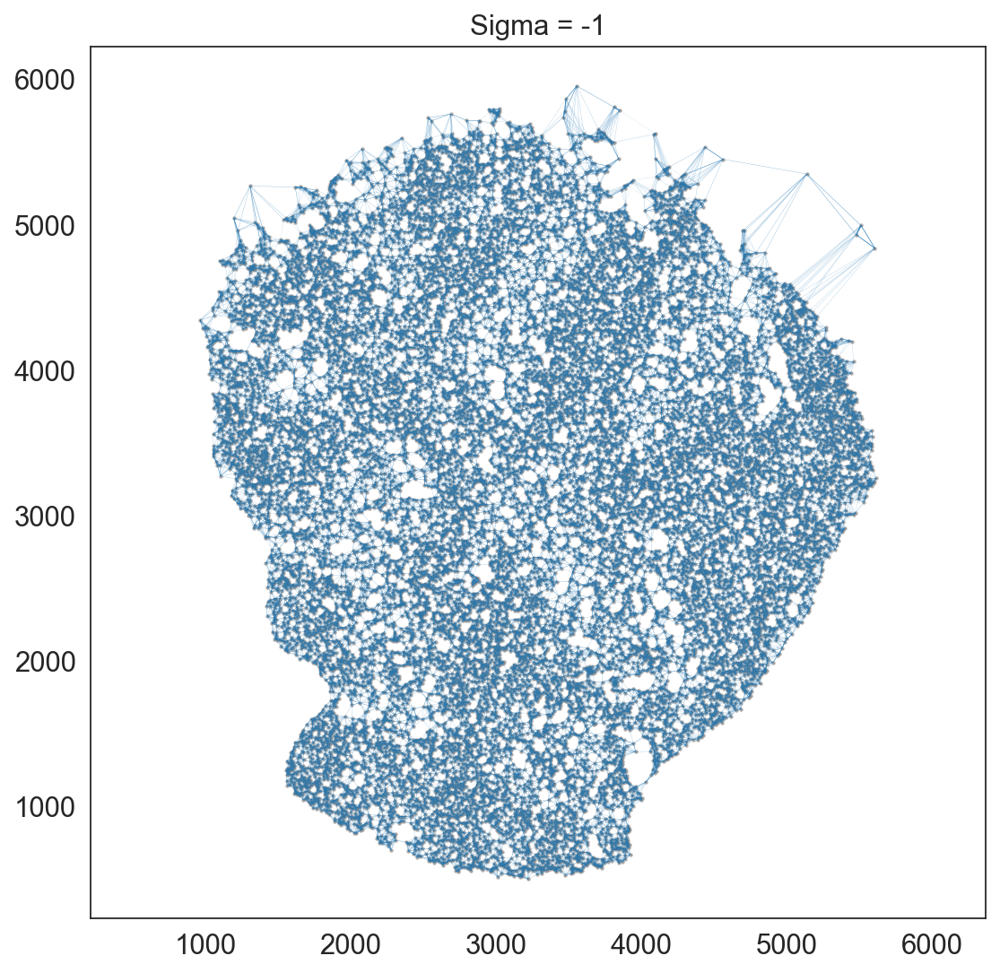

In [9]:
from sklearn.neighbors import NearestNeighbors
from banksy.csr_operations import remove_greater_than, row_normalize
from banksy.main import p_equiv_radius, generate_spatial_weights_fixed_radius, generate_spatial_weights_fixed_nbrs
from utils.plotting import plot_edge_histogram

#
# ---------------------------------------------------------------
# set params
# ---------------------------------------------------------------

visualize_weights = True
num_neighbours = 10 # only for fixed type
p_outside = 0.05
sigmas = (-1, )

# ---------------------------------------------------------------
#


# Find median distance to closest neighbours
# ------------------------------------------

nbrs = NearestNeighbors(algorithm='ball_tree').fit(adata.obsm["coord_xy"])
distances, indices = nbrs.kneighbors(n_neighbors=1)
median_cell_distance = np.median(distances)
print(f"\nMedian distance to closest cell = {median_cell_distance}\n")


# Generate the spatial weights sparse adjacency matrix
# ----------------------------------------------------

processing_dict = {}

for sigma in sigmas:
    
    if sigma < 0:
        
        if sigma == -1: 
            decay_type = "reciprocal"
        elif sigma == -2:
            decay_type = "ranked"
        elif sigma == -3:
            decay_type = "uniform"
        else:
            raise ValueError("Type not recognised")
        
        weights_graph, distance_graph = generate_spatial_weights_fixed_nbrs(
            adata.obsm["coord_xy"],
            num_neighbours=num_neighbours,
            decay_type=decay_type,
            nbr_object=nbrs,
            verbose=False,
        )
        
    else:
    
        weights_graph, distance_graph = generate_spatial_weights_fixed_radius(
            adata.obsm["coord_xy"], 
            p = p_outside,
            nbr_object = nbrs,
            sigma = sigma * median_cell_distance,
            decay_type="gaussian",
            max_num_neighbours=None,
            verbose=False,
        )
        
    processing_dict[sigma]= {"weights": weights_graph}

    # plot histograms of distances/weights between cells
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))
    plot_edge_histogram(distance_graph, ax[0], title="distances between cells")
    plot_edge_histogram(weights_graph, ax[1], title="weights between cells")
#     fig.suptitle(f"weights and distances for sigma = {sigma}")
    fig.tight_layout()
    
print(processing_dict)


# Visualize weights
# -----------------

# print(f"weights_graph for sigma {sigma}:\n{weights_graph}\n")

if visualize_weights:

    from utils.plotting import plot_graph_weights
    
    for sigma in sigmas: 

        plot_graph_weights(
            adata.obsm["coord_xy"], 
            processing_dict[sigma]["weights"],
            #max_weight=.5,
            max_weight=1,
            #markersize=1.5,
            markersize=1,
            figsize=(8, 8),
            title = f"Sigma = {sigma}"
        )
        ax = plt.gca()
        ax.axis("equal")
        
        # Crop spatial graph for readme img
        # ---------------------------------
        #ax.set_xlim(1000,4000)
        #ax.set_ylim(1000,4000)


## Generate BANKSY matrix

1. matrix multiply sparse CSR weights matrix with cell-gene matrix to get **neighbour matrix**
2. z-score both matrices along **genes**
3. multiply each matrix by a weighting factor $\lambda$ (`partition` in code)
4. concatenate the two matrices along the genes dimension

Mar_14_2022_17_02
-1 {'weights': <22128x22128 sparse matrix of type '<class 'numpy.float64'>'
	with 221280 stored elements in Compressed Sparse Row format>}

Cell by gene matrix (<class 'anndata._core.views.SparseCSCView'>) has shape (22128, 2000)
Normalized spatial weights graph adjacency matrix has shape (22128, 22128)
Aggregated Neighbours matrix has shape (22128, 2000)

---- Ran weighted_concatenate in 0.75 s ----

num_nbrs: 2000

Max: 57.33333206176758, Min: 0.0



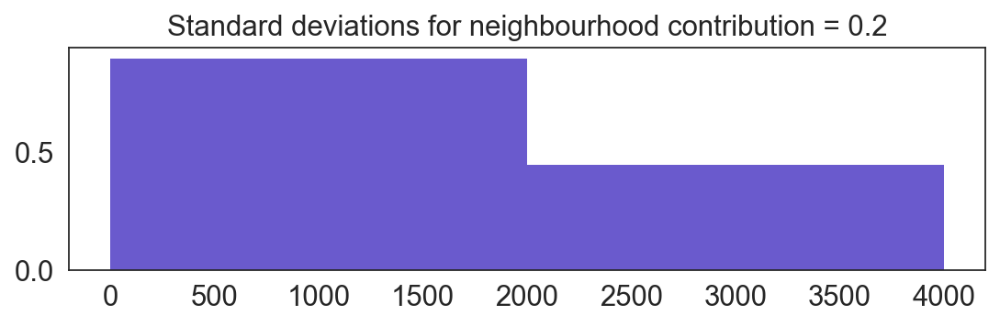

In [10]:
from banksy.main import zscore, weighted_concatenate, banksy_matrix_to_adata

from datetime import datetime
time_str = datetime.now().strftime("%b_%d_%Y_%H_%M")
print(time_str)

# List Genes
# ----------

gene_list = adata.var.index
#print(f"\n{len(gene_list)} genes to be analysed:\n{gene_list}")


#
# -------------------------------------------------------------------------------------
#                             Neighbourhood settings (lambda)
# -------------------------------------------------------------------------------------

nbrhood_contributions = [0.2,] # fraction of total dissimilarity from neighbouring cells

#--------------------------------------------------------------------------------------
#


for sigma in processing_dict:
    
    print(sigma, processing_dict[sigma])
    
    # Compute neighbour averaged feature matrix
    # -----------------------------------------
    
    weights = processing_dict[sigma]["weights"]
    neighbour_agg_matrix = weights @ adata.X
    
    # Save the concatenated un-weighted data (for visualization later)
    # ----------------------------------------------------------------
    
    if sparse.issparse(adata.X):
        concatenated = sparse.hstack((adata.X, neighbour_agg_matrix),)
    else:
        concatenated = np.concatenate((adata.X, neighbour_agg_matrix), axis=1,)
        
    processing_dict[sigma]["norm_counts_concatenated"] = concatenated

    print(
        f"\nCell by gene matrix ({type(adata.X)}) has shape {adata.shape}\n"
        f"Normalized spatial weights graph adjacency matrix has shape {weights.shape}\n"
        f"Aggregated Neighbours matrix has shape {neighbour_agg_matrix.shape}\n"
    )
    
    # Concatenate self / neighbour data
    # ---------------------------------
   
    for nbrhood_contribution in nbrhood_contributions:
        
        banksy_matrix = weighted_concatenate(
            zscore(adata.X, axis = 0), 
            zscore(neighbour_agg_matrix, axis=0),
            nbrhood_contribution
        )
        
        # plot standard deviations per gene / nbr gene
        # --------------------------------------------
        
        if sparse.issparse(banksy_matrix):
            st_dev_pergene = banksy_matrix.todense().std(axis=0)
        else:
            st_dev_pergene = banksy_matrix.std(axis=0)
            
        fig, ax = plt.subplots(figsize=(8,2))
        ax.bar(np.arange(len(st_dev_pergene)), st_dev_pergene, 
               width=1, color = 'slateblue', linewidth=0)
        ax.set_title(f"Standard deviations for neighbourhood contribution = {nbrhood_contribution}")
        
        # save as a new AnnData object
        # ----------------------------
        
        new_adata = banksy_matrix_to_adata(banksy_matrix, adata)
        #display(new_adata)
        
        processing_dict[sigma][nbrhood_contribution] = {
            "adata": new_adata,
        }        

        # save the banksy matrix as a csv
        # -------------------------------

        save = False
        subfolder = os.path.join("slide_seq","v2")
        save_folder = os.path.join("data", subfolder)
        save_name = f"adata_{sigma}_l{nbrhood_contribution}_{time_str}.csv"

        if save:

            try:

                if not os.path.exists(save_folder):
                    os.makedirs(save_folder)
                    
                new_adata.write(filename = save_name)

            except PermissionError:
                print("\nWARNING: Permission denied to save file. Not saving adata.\n")

                
# set up an entry in the nested dictionary for non-spatial results
# ----------------------------------------------------------------

print_max_min(adata)

# first we need to z-score the data matrix
new_adata = adata.copy()
new_adata.X = zscore(new_adata.X, axis = 0)

# here, sigma = 0 and nbr-contributions are also 0, original adata is assigned here as well
processing_dict[0] = {0.0:{"adata": new_adata,}}


## Reduce dimensions of each data matrix

#### PCA to reduce dimensions (either auto-compute or set fixed dimensions to test)

reduction of dimensions from $2 * N_{genes}$ to desired number of dimensions `pca_dims`.

- Uses PCA implemenation from scikit-learn.
- should we use `fit_transform`, or fit followed by dot product of banksy matrix with the components? Seem to give slightly different results

#### UMAP to visualize reduced space

[-1, 0]

Reducing sigma = -1, nbrhood contribution = 0.2

(22128, 4000)

Reduced (22128, 16) matrix:
------------------------------------------------------------
min_value = -101.2013168334961, max = 183.48492431640625


shape of UMAP embedding: (22128, 2)



Reducing sigma = 0, nbrhood contribution = 0.0

(22128, 2000)

Reduced (22128, 16) matrix:
------------------------------------------------------------
min_value = -116.16556549072266, max = 205.16563415527344


shape of UMAP embedding: (22128, 2)




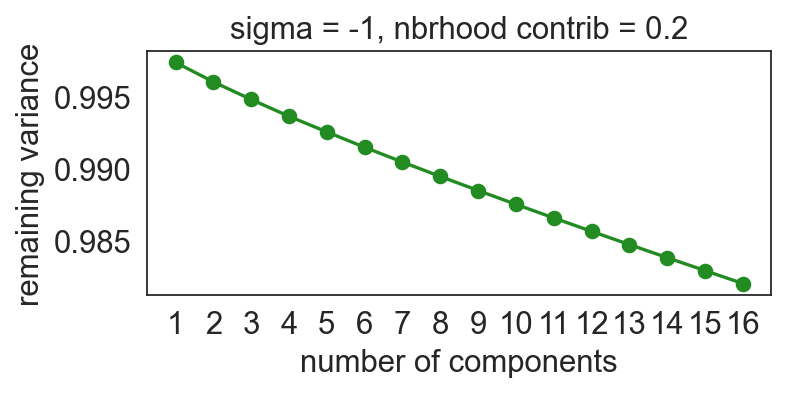

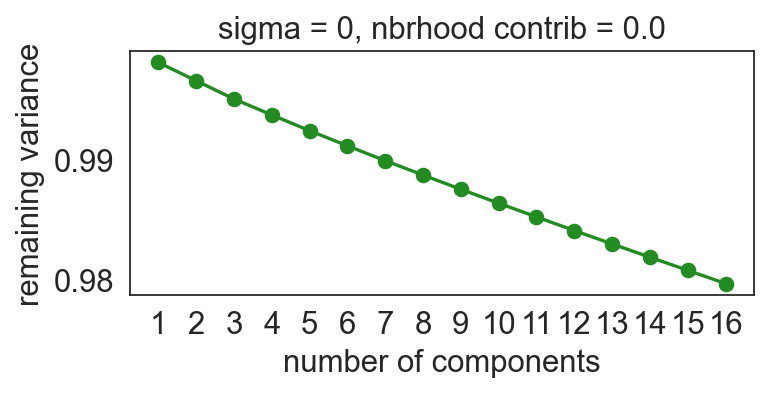

In [11]:
from sklearn.decomposition import PCA
import umap

from utils.pca import plot_remaining_variance, plot_singular_values

#
# -------------------------------------------------------------------------------------
#                               PCA settings
# -------------------------------------------------------------------------------------

pca_dims = [16,] # number of PCA dimensions to reduce to, if autodetect_pcs is False

#--------------------------------------------------------------------------------------
#
#


print(list(processing_dict.keys()))

for sigma in processing_dict:
    
    for nbrhood_contribution in processing_dict[sigma]:
        
        if isinstance(nbrhood_contribution, str):
            continue # skip weights matrices

        print(
            f"\nReducing sigma = {sigma}, nbrhood contribution = {nbrhood_contribution}\n"
            + "=" * 50 + "\n"
        )
        
        # Retrieve anndata object
        # -----------------------
        
        adata_temp = processing_dict[sigma][nbrhood_contribution]["adata"]
        
        if sparse.issparse(adata_temp.X):
            X = adata_temp.X.todense()
            print("Converting sparse data matrix to dense")
        else:
            X = adata_temp.X
            
        print(X.shape)        
        
        # Reduce dimensions by PCA and then UMAP
        # --------------------------------------
            
        for pca_dim in pca_dims:

            pca = PCA(n_components=pca_dim)
            reduced = pca.fit_transform(X)
            
            print(
                f"\nReduced {reduced.shape} matrix:\n" + "-" * 60 
                + f"\nmin_value = {reduced.min()}, max = {reduced.max()}\n\n"
            )
            
            # Plot variance contribution for each component (elbow plot)
            # ----------------------------------------------------------
            
            plot_remaining_variance(
                pca, figsize=(5, 2), 
                title=f"sigma = {sigma}, nbrhood contrib = {nbrhood_contribution}"
            )

            # UMAP
            # ----

            reducer = umap.UMAP(transform_seed = 42)
            umap_embedding = reducer.fit_transform(reduced)
            print(f"shape of UMAP embedding: {umap_embedding.shape}\n\n")

            # save in dictionary
            # ------------------

            adata_temp.obsm[f"reduced_pc_{pca_dim}"] = reduced
            adata_temp.obsm[f"reduced_pc_{pca_dim}_umap"] = umap_embedding
            

# processing_dict, processing_dict.keys(), processing_dict[0].keys()

### Create neighbours graph in the BANKSY space and partition

1. Create nearest neighbours graph in the BANKSY space. Set number of nearest neighbours using `num_banksy_nbrs`
    
2. Convert to shared nearest neighbours

3. Convert to igraph format for leidenalg package to work with

4. Do leiden clustering with ? partition method

In [12]:
from banksy.main import LeidenPartition
import leidenalg
from banksy.labels import Label
import re

resolutions = [
#     0.4, 
    0.6
]
num_nn = 30
num_iterations = 100
partition_seed = 1234 # match vipul's seed
match_labels = True # whether to keep labels consistent across different hyperparameter setting

results = {}

print(list(processing_dict.keys()))

for sigma in processing_dict:
    
    print("Sigma: ", sigma)
    
    for nbrhood_contribution in processing_dict[sigma]:
        
        if isinstance(nbrhood_contribution, str):
                continue # skip weights matrices
        
        print("Neighbourhood Contribution: ", nbrhood_contribution)
        
        adata_temp = processing_dict[sigma][nbrhood_contribution]["adata"]
        print("adata temp", adata_temp)
        pca_dims = []
        
        for key in adata_temp.obsm_keys():
            
            print(key, "\n")
            match = re.search(r"reduced_pc_([0-9]+)$", key)
            if match:
                pca_dims.append(int(match.group(1)))
                
        print("PCA dims to analyse:", pca_dims)

        for pca_dim in pca_dims:
            
            if isinstance(pca_dim, str):
                continue # skip full concatenated matrices
            
            print("\n" + "=" * 100 + 
                  f"\nSetting up partitioner for (sigma = {sigma}, "
                  f"Neighbourhood contribution = {nbrhood_contribution}, "
                  f"PCA dimensions = {pca_dim})\n" + "=" * 100 + "\n")
            
            banksy_reduced = adata_temp.obsm[f"reduced_pc_{pca_dim}"]
#             banksy_reduced = processing_dict[sigma][nbrhood_contribution][pca_dim]["reduced"]
            
            partitioner = LeidenPartition(
                banksy_reduced,
                num_nn = num_nn,
                nns_have_weights = True,
                compute_shared_nn = True,
                filter_shared_nn = True,
                shared_nn_max_rank = 3,
                shared_nn_min_shared_nbrs = 5,
                verbose = True, 
            )

            for resolution in resolutions:

                print(f"\nResolution: {resolution}\n" + "-" * 30 + "\n")


                # partition
                # ---------

                label, modularity = partitioner.partition(
                    resolution = resolution,
                    partition_metric = leidenalg.RBConfigurationVertexPartition,
                    #partition_metric=leidenalg.CPMVertexPartition,
                    n_iterations = num_iterations,
                    seed = partition_seed,
                )

                # store results in dictionary
                # ---------------------------

                param_str = f"s{sigma}_pc{pca_dim}_nc{nbrhood_contribution:0.2f}_r{resolution:0.2f}"
                results[param_str] = {
                    "sigma":sigma,
                    "nbrhood_contribution": nbrhood_contribution,
                    "num_pcs":pca_dim,
                    "resolution":resolution,
                    "num_labels":label.num_labels,
                    "labels":label,
                    "adata": processing_dict[sigma][nbrhood_contribution]["adata"]
                }

    
# convert results dictionary into dataframe
# -----------------------------------------

results_df = pd.DataFrame.from_dict(results, orient='index')
# display(results_df)

results_df.sort_values(by=["sigma", "nbrhood_contribution", "num_pcs", "resolution"], 
                       ascending=True, inplace=True)

print("\nSorted Dataframe:\n")
    
display(results_df)
print(f"Shape of dataframe: {results_df.shape}")


# find the maximum number of labels across all parameter sets
# -----------------------------------------------------------

max_num_labels = results_df["num_labels"].max()
print(f"Maximum number of labels: {max_num_labels}\n")

# Match the labels
# ----------------

if match_labels:
    
    from banksy.labels import match_label_series

    results_df["relabeled"], max_num_labels = match_label_series(
        results_df["labels"],
        extra_labels_assignment="greedy",
        verbose=False,
    )

    display(results_df)

[-1, 0]
Sigma:  -1
Neighbourhood Contribution:  0.2
adata temp AnnData object with n_obs × n_vars = 22128 × 4000
    obs: 'xcoord', 'ycoord', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_counts'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'is_nbr'
    obsm: 'reduced_pc_16', 'reduced_pc_16_umap'
reduced_pc_16 

reduced_pc_16_umap 

PCA dims to analyse: [16]

Setting up partitioner for (sigma = -1, Neighbourhood contribution = 0.2, PCA dimensions = 16)


Nearest-neighbour weighted graph (dtype: float64, shape: (22128, 22128)) has 663840 nonzero entries.
---- Ran find_nn in 12.84 s ----


Nearest-neighbour connectivity graph (dtype: int16, shape: (22128, 22128)) ha

,sigma,nbrhood_contribution,num_pcs,resolution,num_labels,labels,adata
s-1_pc16_nc0.20_r0.60,-1,0.2,16,0.6,20,"Label object:\nNumber of labels: 20, number of...",[[[View of AnnData object with n_obs × n_vars ...
s0_pc16_nc0.00_r0.60,0,0.0,16,0.6,20,"Label object:\nNumber of labels: 20, number of...",[[[View of AnnData object with n_obs × n_vars ...


Shape of dataframe: (2, 7)
Maximum number of labels: 20


Maximum number of labels = 20
Indices of sorted list: [0 1]

Expanding labels with ids: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19] so that ids range from 0 to 19

Label ids zerod: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19].
0 to be inserted between each id: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
0 extra rows to be randomly inserted: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
New ids: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19]
---- Ran expand_labels in 0.00 s ----

---- Ran match_labels in 0.01 s ----



,sigma,nbrhood_contribution,num_pcs,resolution,num_labels,labels,adata,relabeled
s-1_pc16_nc0.20_r0.60,-1,0.2,16,0.6,20,"Label object:\nNumber of labels: 20, number of...",[[[View of AnnData object with n_obs × n_vars ...,"Label object:\nNumber of labels: 20, number of..."
s0_pc16_nc0.00_r0.60,0,0.0,16,0.6,20,"Label object:\nNumber of labels: 20, number of...",[[[View of AnnData object with n_obs × n_vars ...,"Label object:\nNumber of labels: 20, number of..."


number of labels: 20
---- Ran plot_2d_embeddings in 0.00 s ----

number of labels: 20
---- Ran plot_2d_embeddings in 0.00 s ----

number of labels: 20
---- Ran plot_2d_embeddings in 0.00 s ----

---- Ran row_normalize in 0.00 s ----


matrix multiplying labels x weights x labels-transpose ((20, 22128) x (22128, 22128) x (22128, 20))

number of labels: 20
---- Ran plot_2d_embeddings in 0.00 s ----

number of labels: 20
---- Ran plot_2d_embeddings in 0.01 s ----

number of labels: 20
---- Ran plot_2d_embeddings in 0.00 s ----

---- Ran row_normalize in 0.00 s ----


matrix multiplying labels x weights x labels-transpose ((20, 22128) x (22128, 22128) x (22128, 20))



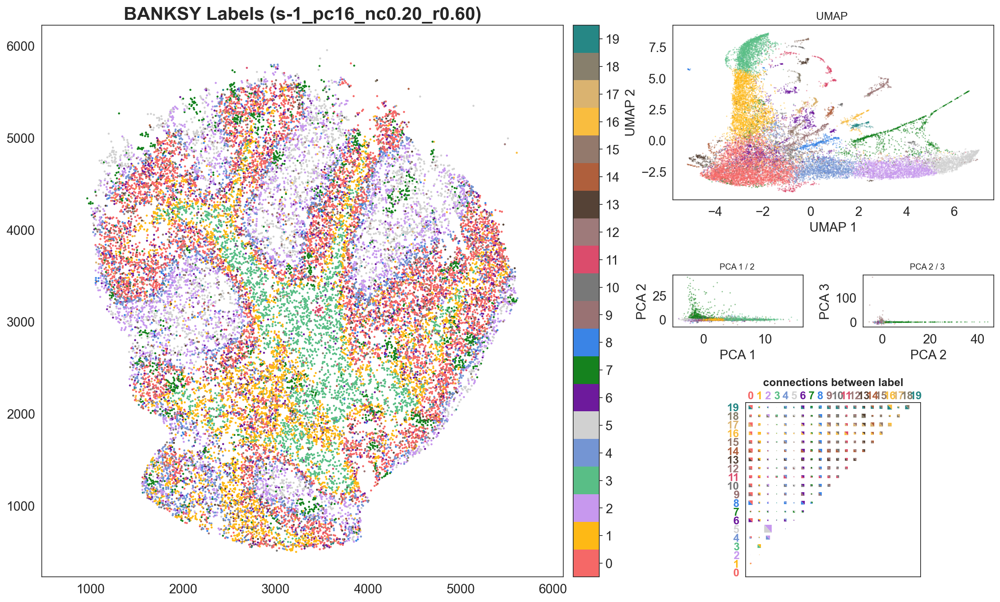

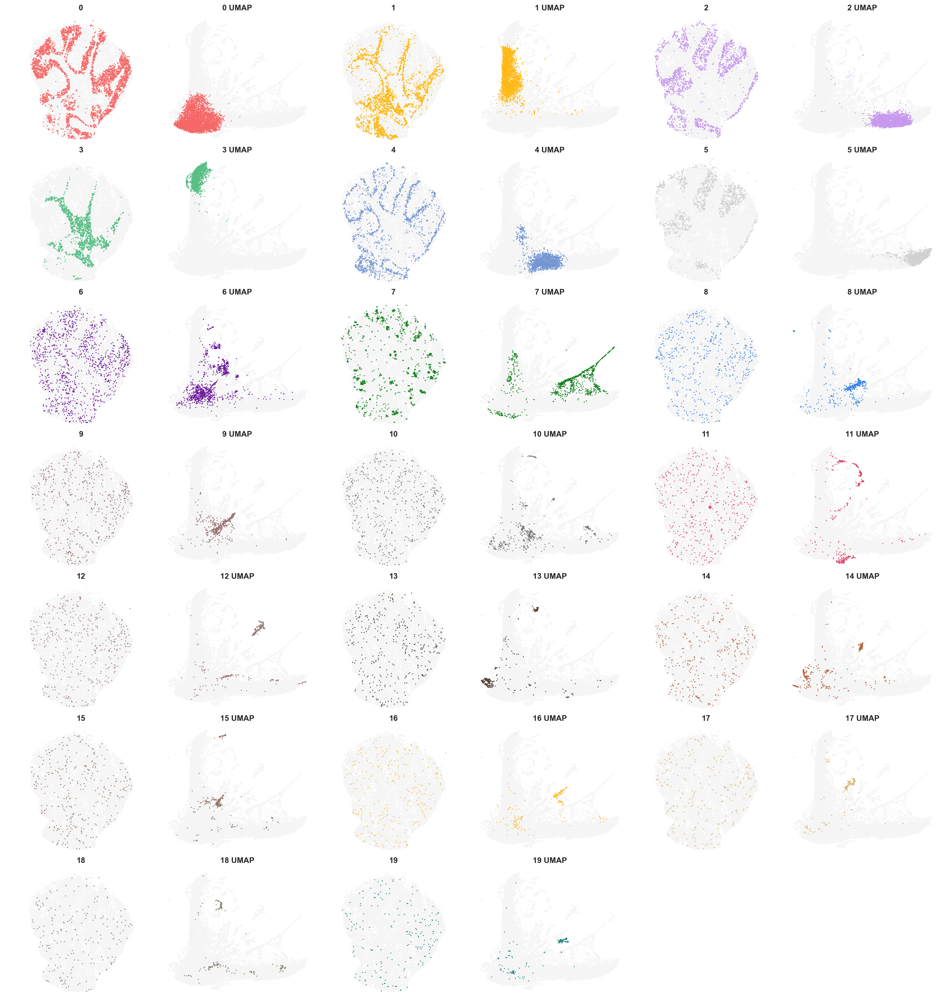

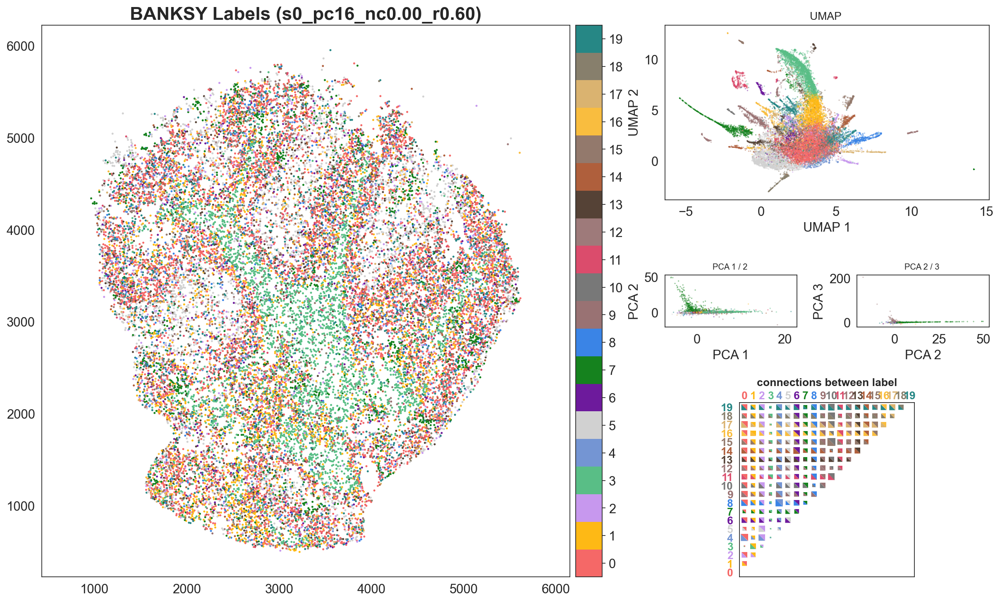

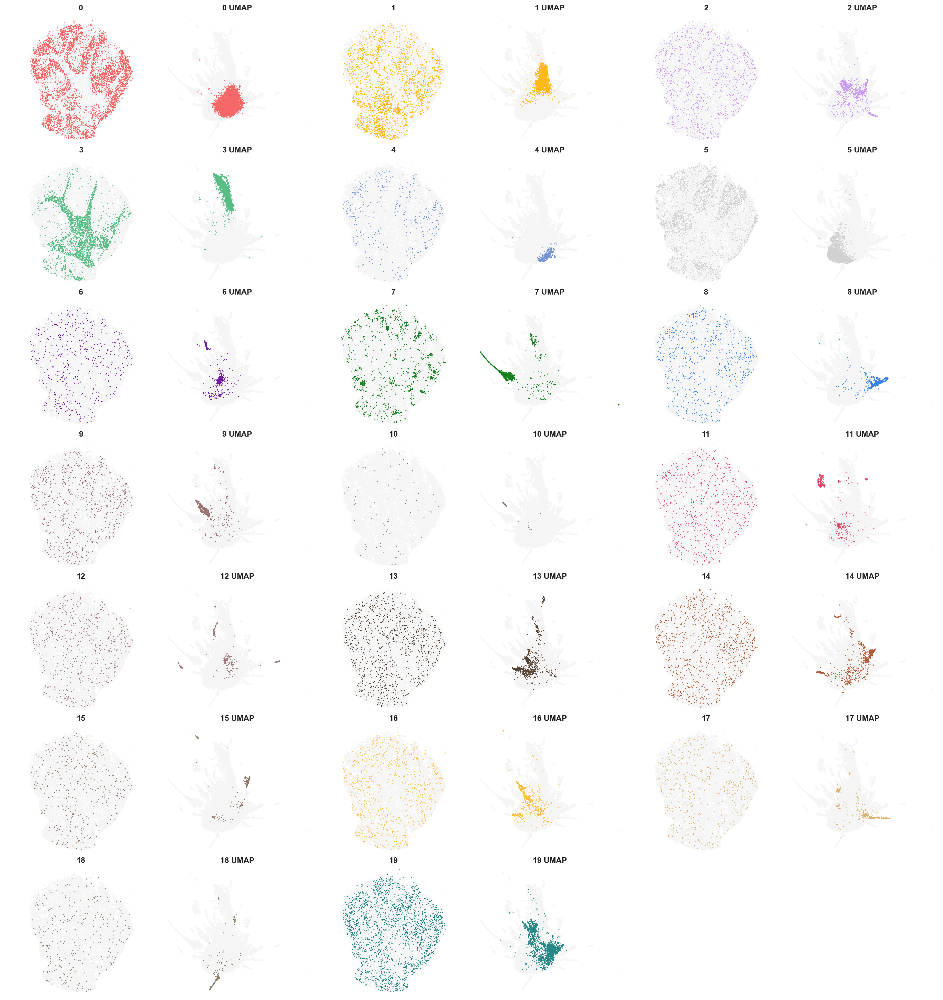

In [13]:
from utils.plotting import plot_2d_embeddings, plot_labels_seperately, plot_label_subset
from banksy.labels import plot_connections

import matplotlib as mpl
import matplotlib.gridspec as gridspec


use_sc_plot = False # Plot another location plot using scanpy's embedding function
save_all_h5ad = True # save the adata objects

# Generate discrete colormap 
# --------------------------
# colours borrowed from spagcn tutorial, not sure where they got them from originally
# can also use standard matplotlib colormaps e.g. spectral or tab10 or tab20

plot_color = [
"#F56867",    "#FEB915",    "#C798EE",    "#59BE86",    "#7495D3",
"#D1D1D1",    "#6D1A9C",    "#15821E",    "#3A84E6",    "#997273",
"#787878",    "#DB4C6C",    "#9E7A7A",    "#554236",    "#AF5F3C",
"#93796C",    "#F9BD3F",    "#DAB370",    "#877F6C",    "#268785"
]
cmap_discrete = mpl.colors.ListedColormap(plot_color[:max_num_labels])


for params_name in results_df.index:
    
    if match_labels:
        labels = results_df.loc[params_name, "relabeled"]
    else:
        labels = results_df.loc[params_name, "labels"]
        
    adata_temp = results_df.loc[params_name, "adata"]
    num_pcs = results_df.loc[params_name, "num_pcs"]
    pc_temp = adata_temp.obsm[f"reduced_pc_{num_pcs}"]
    umap_temp = adata_temp.obsm[f"reduced_pc_{num_pcs}_umap"]
    
    label_name = f"labels_{params_name}"
    #adata_temp.obs[label_name] = labels.dense
    adata_temp.obs[label_name] = np.char.mod('%d', labels.dense)
    adata_temp.obs[label_name] = adata_temp.obs[label_name].astype('category')
    
    if save_all_h5ad:
        adata_temp.write(os.path.join(filepath, f"slideseq_mousecerebellum_{params_name}.h5ad"))
    
    # Main Figure
    # -----------
    
    adata_temp.obsm["coord_xy"] = np.vstack(
        (adata_temp.obs["xcoord"].values,adata_temp.obs["ycoord"].values)
    ).T
       
    if use_sc_plot:
        sc.pl.embedding(adata_temp, basis = "coord_xy", color=label_name, size=5)
        
    fig = plt.figure(figsize=(15, 9), constrained_layout=True)
    grid = fig.add_gridspec(ncols=4, nrows=3, 
                            width_ratios=[2, 0.1, 0.5, 0.5],
                            height_ratios=[1, 0.3, 1])
    
    # Plot Labels
    # -----------
    
    #cmap_name = 'tab20c'
    cmap_name = cmap_discrete

    ax_locs = fig.add_subplot(grid[:, 0])

    scatterplot = ax_locs.scatter(adata_temp.obsm["coord_xy"][:, 0], 
                                  adata_temp.obsm["coord_xy"][:, 1],
                                  c=labels.dense, 
                                  cmap=cmap_name,
                                  vmin = 0, vmax=max_num_labels-1,
                                  s=1.5, alpha=1.0)
    ax_locs.set_aspect('equal', 'datalim')
    ax_locs.set_title(f'BANKSY Labels ({params_name})', fontsize=20, fontweight="bold")
    #ax_locs.set_ylim(ax_locs.get_ylim()[::-1])

    ax_cbar = fig.add_subplot(grid[:, 1])
    cbar = fig.colorbar(
        scatterplot,
        boundaries=np.arange(max_num_labels + 1) - 0.5,
        cax = ax_cbar,
    )
    cbar.set_ticks(labels.ids)
    cbar.set_ticklabels(labels.ids)
    
        
    # Seperate Location plots
    # -----------------------
    
    plot_labels_seperately(
        labels, adata_temp.obsm["coord_xy"],
        embeddings = umap_temp,
        cmap_name = cmap_name,
        #cmap_name = None,
        default_colour="tab:red",
        plots_per_row = 3,
        spot_size = 0.3,
        subplot_size = (3, 3),
        flip_axes = False,
        verbose = False,
    )
    

    # Plot UMAP (again but with labels)
    # ---------------------------------

    ax_umap = fig.add_subplot(grid[0, -2:])
    plot_2d_embeddings(umap_temp, labels.dense,
                       method_str="UMAP",
                       space_str="",
                       xlabel="UMAP 1", ylabel="UMAP 2",
                       ax = ax_umap,
                       cmap_name = cmap_name,
                       plot_cmap = False,
                      )
    
    # Plot 1st 2 dimensions of PCA
    # ----------------------------

    dim_sets = (pc_temp[:, :2], pc_temp[:, 1:3])
    dims1 = (0, 1,)
    dims2 = (1, 2,)
    axes = [fig.add_subplot(grid[1, 2+axnum]) for axnum in range(2)]

    for dim_set, dim1, dim2, ax in zip(dim_sets, dims1, dims2, axes):
        plot_2d_embeddings(dim_set, labels.dense,
                           method_str=f"PCA {dim1 + 1} / {dim2 + 1}",
                           space_str="",
                           xlabel=f"PCA {dim1 + 1}", ylabel=f"PCA {dim2 + 1}",
                           ax = ax,
                           cmap_name = cmap_name,
                           plot_cmap = False,
                           title_fontsize = 9)
        
    # Plot connectivity between labels
    # --------------------------------

    ax_connections = fig.add_subplot(grid[-1, -2:])
    plot_connections(
        labels, weights_graph,
        ax_connections,
        zero_self_connections=True,
        title_str="connections between label",
        colormap_name = cmap_name,
    )

### Manually annotate clusters

Maximum number of labels: 20

{'0': 'Granular Layer 1', '6': 'Granular Layer 2', '1': 'Oligodendrocyte/Polydendrocyte 1', '3': 'Oligodendrocyte/Polydendrocyte 2', '2': 'Interneurons Pvalb 1', '5': 'Interneurons Pvalb 2', '4': 'Purkinje/Bergmann', '7': 'RBC', '8': 'other', '9': 'other', '10': 'other', '11': 'other', '12': 'other', '13': 'other', '14': 'other', '15': 'other', '16': 'other', '17': 'other', '18': 'other', '19': 'other'} 
 {'0': 'Granular Layer 1', '6': 'Granular Layer 2', '1': 'Oligodendrocyte/Polydendrocyte 1', '3': 'Oligodendrocyte/Polydendrocyte 2', '2': 'Interneurons Pvalb 1', '5': 'Interneurons Pvalb 2', '4': 'Purkinje/Bergmann', '7': 'RBC', '8': 'other', '9': 'other', '10': 'other', '11': 'other', '12': 'other', '13': 'other', '14': 'other', '15': 'other', '16': 'other', '17': 'other', '18': 'other', '19': 'other'}
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarr

C:\Users\chousn\AppData\Local\Continuum\anaconda3\envs\scanpy_mar22\lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
C:\Users\chousn\AppData\Local\Continuum\anaconda3\envs\scanpy_mar22\lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
C:\Users\chousn\AppData\Local\Continuum\anaconda3\envs\scanpy_mar22\lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
C:\Users\chousn\AppData\Local\Continuum\anaconda3\envs\scanpy_mar22\lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
C:\Users\chousn\AppData\Local\Continuum\anaconda3\envs\scanpy_mar22\lib\site-pac

    finished (0:00:11)
Storing dendrogram info using `.uns['dendrogram_cell type']`


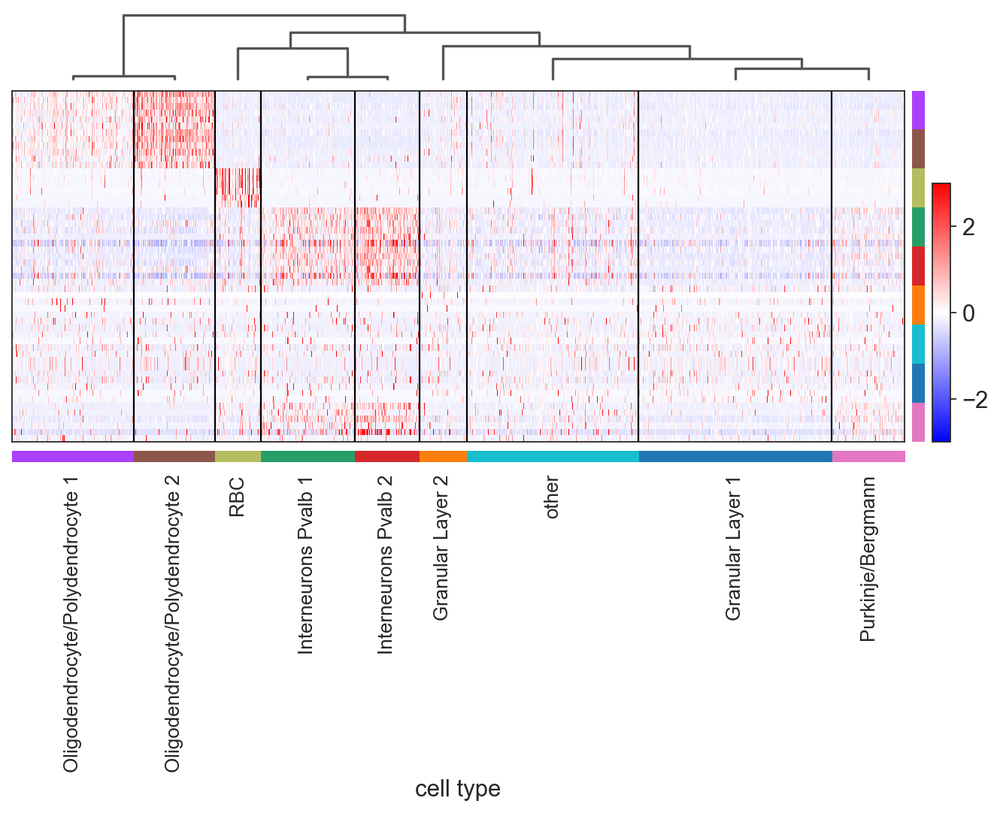

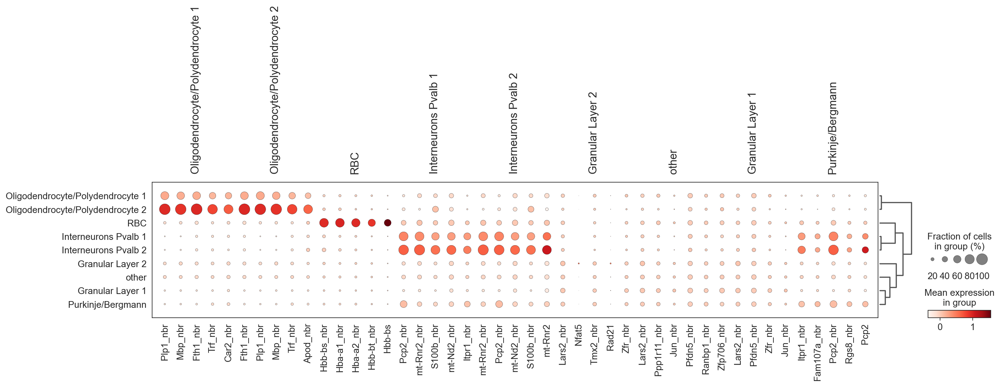

In [14]:
max_num_labels = results_df["num_labels"].max()
print(f"Maximum number of labels: {max_num_labels}\n")

def pad_clusters(clust2annotation:dict, 
                 original_clusters:list, 
                 pad_name:str = "other"):
    """
    Add dictionary entries for unknown clusters,
    annotating them identically with pad_name
    If pad_name is None, then keep original name
    convert to str if given integers as original clusters
    """
    for cluster in original_clusters:
        cluster = str(cluster)
        if cluster not in clust2annotation:
            if pad_name is not None:
                clust2annotation[cluster] = pad_name
            else:
                clust2annotation[cluster] = cluster


cluster2annotation_spatial = {
    "0" : "Granular Layer 1",
    "6" : "Granular Layer 2",
    "1" : "Oligodendrocyte/Polydendrocyte 1",
    "3" : "Oligodendrocyte/Polydendrocyte 2",
    "2" : "Interneurons Pvalb 1",
    "5" : "Interneurons Pvalb 2",
    "4" : "Purkinje/Bergmann",
    "7": "RBC",
    
#     "2" : "Interneurons Pvalb",
#     "4" : "Purkinje/Bergmann",

#     "11": "Choroid Plexus",
#     "12": "Unknown 1",
#     "10": "RBC",
#     "14": "Unknown 2",
}

pad_clusters(cluster2annotation_spatial, list(range(max_num_labels)))

# clusters mostly match, so use the same labels
cluster2annotation_nonspatial = cluster2annotation_spatial
# cluster2annotation_nonspatial["4"] = "Interneurons Pvalb 2"
pad_clusters(cluster2annotation_nonspatial, list(range(max_num_labels)))

print(cluster2annotation_spatial,"\n", cluster2annotation_nonspatial)

# save annotations
# ----------------

resolution = resolutions[0]

params_name = f"s-1_pc16_nc0.20_r{resolution:0.2f}"
adata_spatial = results_df.loc[params_name, "adata"]
label_name = f"labels_{params_name}"
adata_spatial.obs['cell type'] = adata_spatial.obs[label_name].map(
    cluster2annotation_spatial
).astype('category')

params_name = f"s0_pc16_nc0.00_r{resolution:0.2f}"
adata_nonspatial = results_df.loc[params_name, "adata"]
label_name = f"labels_{params_name}"
adata_nonspatial.obs['cell type'] = adata_nonspatial.obs[label_name].map(
    cluster2annotation_nonspatial
).astype('category')

for adata in [adata_spatial, 
              #adata_nonspatial
             ]:
    
    # Plot Differentially Expressed (DE) genes per group
    # --------------------------------------------------

    sc.tl.rank_genes_groups(adata, groupby='cell type', method='wilcoxon', verbose=True)
    sc.tl.dendrogram(adata, groupby='cell type')

    sc.pl.rank_genes_groups_heatmap(adata, n_genes=6, 
                                    vmin=-3, vmax=3, cmap='bwr', 
                                    swap_axes=True)
    sc.pl.rank_genes_groups_dotplot(adata, n_genes=5)


### DE analysis of self genes (only) from BANKSY clustering

{'0': 'Granular Layer 1', '6': 'Granular Layer 2', '1': 'Oligodendrocyte/Polydendrocyte 1', '3': 'Oligodendrocyte/Polydendrocyte 2', '2': 'Interneurons Pvalb 1', '5': 'Interneurons Pvalb 2', '4': 'Purkinje/Bergmann', '7': 'RBC', '8': 'other', '9': 'other', '10': 'other', '11': 'other', '12': 'other', '13': 'other', '14': 'other', '15': 'other', '16': 'other', '17': 'other', '18': 'other', '19': 'other'} 
 {'0': 'Granular Layer 1', '6': 'Granular Layer 2', '1': 'Oligodendrocyte/Polydendrocyte 1', '3': 'Oligodendrocyte/Polydendrocyte 2', '2': 'Interneurons Pvalb 1', '5': 'Interneurons Pvalb 2', '4': 'Purkinje/Bergmann', '7': 'RBC', '8': 'other', '9': 'other', '10': 'other', '11': 'other', '12': 'other', '13': 'other', '14': 'other', '15': 'other', '16': 'other', '17': 'other', '18': 'other', '19': 'other'}
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids


C:\Users\chousn\AppData\Local\Continuum\anaconda3\envs\scanpy_mar22\lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
C:\Users\chousn\AppData\Local\Continuum\anaconda3\envs\scanpy_mar22\lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
C:\Users\chousn\AppData\Local\Continuum\anaconda3\envs\scanpy_mar22\lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
C:\Users\chousn\AppData\Local\Continuum\anaconda3\envs\scanpy_mar22\lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
C:\Users\chousn\AppData\Local\Continuum\anaconda3\envs\scanpy_mar22\lib\site-pac

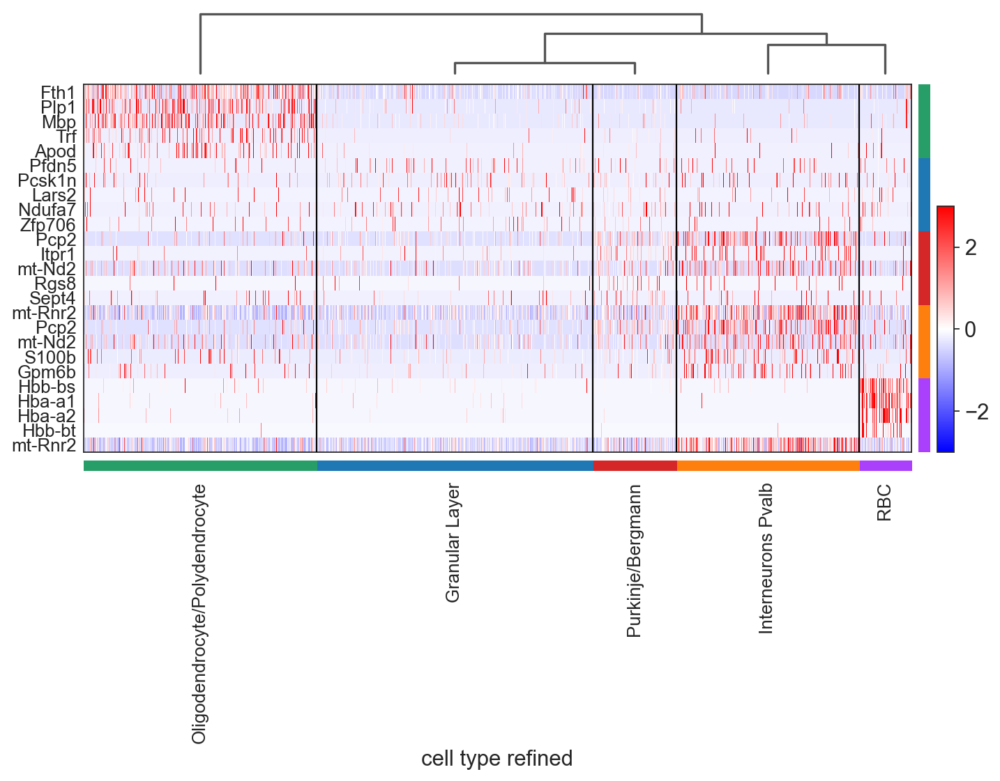

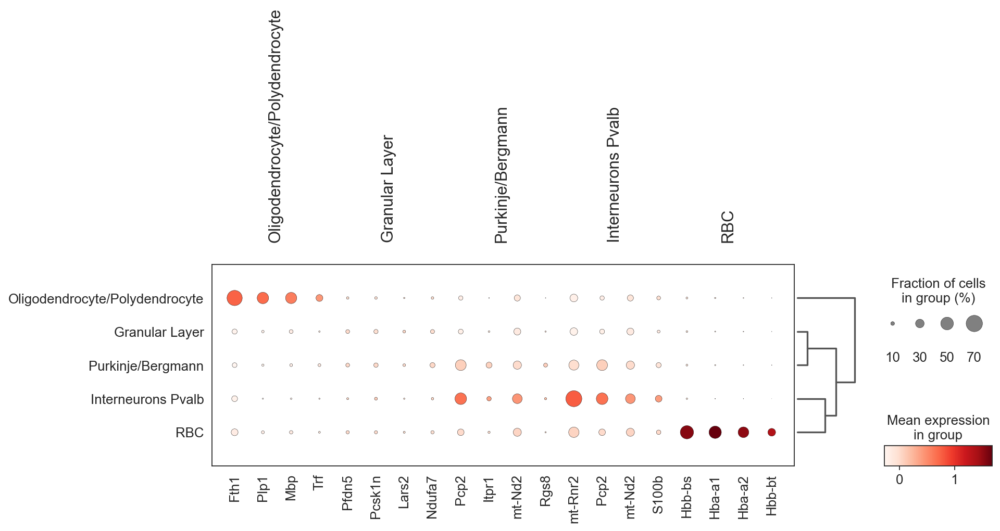

In [15]:
cluster2annotation_refine = {
    "Oligodendrocyte/Polydendrocyte 1": "Oligodendrocyte/Polydendrocyte",
    "Oligodendrocyte/Polydendrocyte 2": "Oligodendrocyte/Polydendrocyte",
    "Granular Layer 1" : "Granular Layer",
    "Granular Layer 2" : "Granular Layer",
    "Interneurons Pvalb 1" : "Interneurons Pvalb",
    "Interneurons Pvalb 2" : "Interneurons Pvalb",
}

for adata in [adata_nonspatial, adata_spatial]:

    pad_clusters(cluster2annotation_refine, adata.obs["cell type"], pad_name=None)
    #print(f"New cluster dictionary: {cluster2annotation_refine}")

    adata.obs["cell type refined"] = adata.obs["cell type"].map(
        cluster2annotation_refine
    ).astype('category')
    
# remove other category
adata_spatial_filtered = adata_spatial[adata_spatial.obs["cell type refined"] != "other",:]
adata_nonspatial_filtered = adata_nonspatial[adata_nonspatial.obs["cell type refined"] != "other",:]

print(cluster2annotation_spatial,"\n", cluster2annotation_nonspatial)

# Plot Differentially Expressed (DE) genes per group
# --------------------------------------------------

adata_self = adata_spatial_filtered[:,adata_spatial_filtered.var["is_nbr"]==False].copy()

sc.tl.rank_genes_groups(adata_self, groupby='cell type refined', method='wilcoxon', verbose=True)
sc.tl.dendrogram(adata_self, groupby='cell type refined')

sc.pl.rank_genes_groups_heatmap(adata_self, n_genes=5, 
                                vmin=-3, vmax=3, cmap='bwr', 
                                swap_axes=True)
fig, ax = plt.subplots(figsize=(12,5))
sc.pl.rank_genes_groups_dotplot(adata_self, n_genes=4, 
                                groups = None,
                                ax=ax)

#fig.savefig(os.path.join(filepath, "dotplot_spatial_sseqcerebellum_v2.eps"), format='eps', dpi=1200)

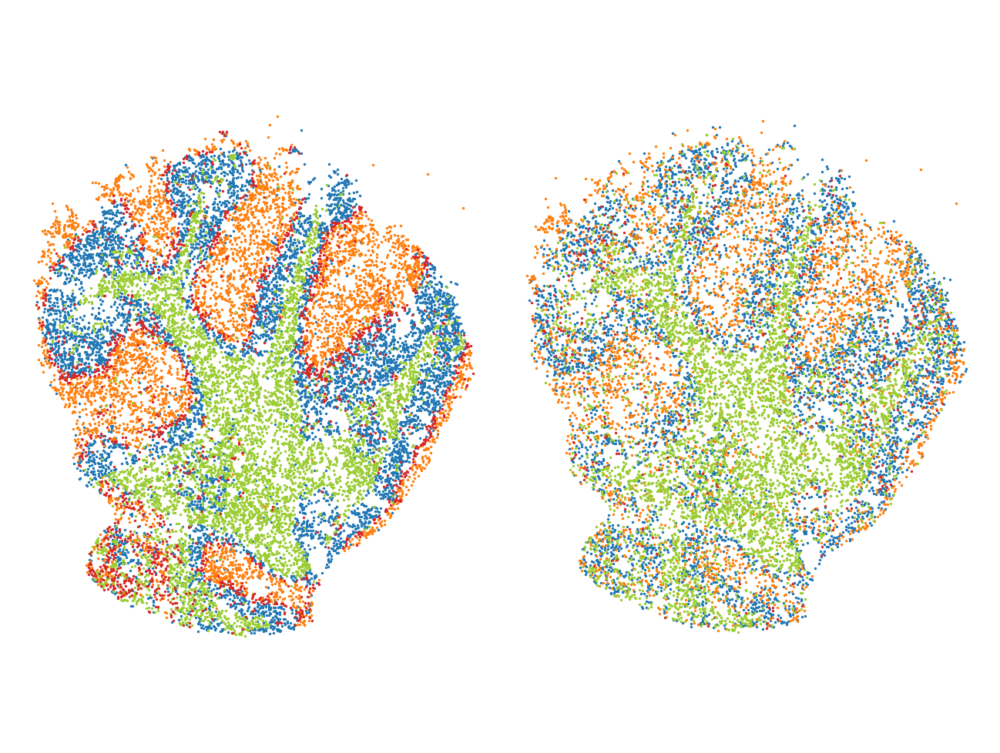

In [16]:
other_clusters_as_gray = False

fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(8, 6), constrained_layout=True)

colours_dict = {
    "Granular Layer 1" : "tab:blue",
    "Granular Layer 2" : "tab:blue",
    "Interneurons Pvalb 1" : "tab:orange",
    "Interneurons Pvalb 2" : "tab:orange",
    "Purkinje/Bergmann" : "tab:red",
    "Oligodendrocyte/Polydendrocyte 1": "yellowgreen",
    "Oligodendrocyte/Polydendrocyte 2": "yellowgreen",
}

for n, adata in enumerate([adata_spatial, adata_nonspatial]):
    
    ax_loc = axs[n]
#     ax_umap = axs[n,1]
    
    umap_name = "reduced_pc_16_umap"
    
    if other_clusters_as_gray:
        
        for layer in adata.obs["cell type"].cat.categories:

            if layer not in colours_dict:
                c = "gray"
                locations = adata.obsm["coord_xy"][adata.obs["cell type"]==layer,:]
                umap_embedding = adata.obsm[umap_name][adata.obs["cell type"]==layer,:]
                loc_plot = ax_loc.scatter(locations[:, 0], locations[:, 1], c=c, s=.1, alpha=1.0)
                umap_plot = ax_umap.scatter(umap_embedding[:, 0], umap_embedding[:, 1], c=c, s=.1, alpha=1.0)
                
    
    for layer in adata.obs["cell type"].cat.categories:
                
        if layer in colours_dict:
            c = colours_dict[layer]
            locations = adata.obsm["coord_xy"][adata.obs["cell type"]==layer,:]
            umap_embedding = adata.obsm[umap_name][adata.obs["cell type"]==layer,:]
            loc_plot = ax_loc.scatter(locations[:, 0], locations[:, 1], c=c, s=.3, alpha=1.0)
            #umap_plot = ax_umap.scatter(umap_embedding[:, 0], umap_embedding[:, 1], c=c, s=.1, alpha=1.0)
    
    ax_loc.set_aspect('equal', 'datalim')
    #ax_umap.set_aspect('equal', 'datalim')
    #ax.set_title(f'Cell layers', fontsize=20, fontweight="bold",)
    #ax_loc.set_ylim(ax_locs.get_ylim()[::-1])
    ax_loc.axis("off")
    #ax_umap.axis("off")
    
#fig.suptitle("Selected Cell layers", fontweight = "bold")
fig.savefig(os.path.join(filepath, "all_layers_sseqcerebellum_v1.eps"), format='eps', dpi=1200)

## Plot DE genes of clusters from scRNAseq reference atlas

DE genes obtained from dropviz.org

In [17]:
# display(adata_allgenes)
print_max_min(adata_allgenes)

# z-score the unfiltered gene-cell matrix
# ---------------------------------------
sc.pp.scale(adata_allgenes)
# display(adata_allgenes)
print_max_min(adata_allgenes)


Max: 60.51852035522461, Min: 0.0

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption

Max: 145.7476806640625, Min: -0.9832602143287659



### Import RCTD weights

Import RCTD results (both weights, imported as a Matrix Market `.txt` file and location ids + coordinates, as a `.csv` file). RCTD performs its own filtering steps which do not match filtering used in this notebook, so we have to find the intersection of the 2 sets of filtered locations. RCTD filtering seems to be more stringent.

In [18]:
from utils.plotting import plot_continuous

from scipy.io import mmread

# load weights and locations 
rctd_coord_filename = "slideseqv1_mc_coords_filtered.csv"
rctd_weights_filename = "slideseqv1_mc_RCTDweights.txt"
rctd_coord = pd.read_csv(os.path.join(filepath, rctd_coord_filename), index_col = 0)
rctd_weights = mmread(os.path.join(filepath, rctd_weights_filename)).todense()

#display(rctd_coord)

# labels for clusters in dropviz scRNAseq dataset (see dropviz.org)
dropviz_dict = {
    "GranularNeuron_Gabra6" : 1,
    "PurkinjeNeuron_Pcp2": 2,
    "Interneurons_Pvalb": 3,
    "Interneurons_and_Other_Nnat":4,
    "Microglia_Macrophage_C1qb":5,
    "Oligodendrocyte_Polydendrocyte_Tfr_Tnr": 6,
    "BergmannGlia_Gpr37l1": 7,
    "Astrocyte_Gja1": 8,
    "Choroid_Plexus_Ttr": 9,
    "Endothelial_Flt1":10,
    "Fibroblast-Like_Dcn":11,
}

### Get scRNA-seq reference marker genes and compute metagene

Marker genes are obtained from reference scRNA-seq dataset available at **dropviz.org**. 

DE genes are compared against rest of cerebellum with parameters (*default*):
 - Minimum Fold Ratio = 2
 - Minimum P-Value Exponenet = -100
 - Min Mean Log Amount in Target = 2.5
 - Max Mean Log amount in Comp = 1
 
Marker genes filtered out in preprocessing are not included.


In [19]:
markergenes_dict = {
    "GranularNeuron_Gabra6": [
        "Sh3bgr", "Fat2", "Kcnj12", "Bcl2l15", "Reln", "Uncx", "Plk5", "Tmem163", "Grin2a", "Rims3", "Lrrtm3", "Mctp1",
        "Grin2c", "Ipcef1", "Nr4a2", "Sptb"
    ],
    "PurkinjeNeuron_Pcp2": [
        "Arhgef33", "Ppp1r17", "Nrk", "Clmn", "Slc1a6", "Atp2a3", "Nexn", "Cck", "Camk2a", "Ppp1r16b", "Sycp1", "Itpka",
        "RP23-372N19.2", "Trabd2b", "Gm5083", "Cabp7", "Gm14033", "Cacna1g", "Prkcg", "B3gnt5", "Scn4b", "Cep76",
        "Pde5a", "Shank2", "Kcna6", "Tmem255a", "Prmt8", "Fam174b", "Eps8l2", "Stk17b", "Cmya5", "Plxdc1", "Col18a1",
        "Hes3", "Cntnap5b", "Krt25", "Scd3", "Trpc3", "Atrnl1", "Iltifb", "Kcng4", "Tuba8", "A330050F15Rik", "Shisa6",
        "Bcl11a", "Dagla", "Htr1b", "Nell1", "Ppp4r4", "Cacnb2", "Ebf2", "Zfp385c", "Clip4", "Srgap1", "Arhgap32",
        "Plekhd1", "Grik1", "Epha5", "Kcnip1", "Slc35f1", "Car7", "Ptprm", "Large", "Pcsk6", "Robo2", "Adgrl2", "Lhx5",
        "Ptchd4", "Casq2"
    ],
    "Interneurons_Pvalb": [
        "Kit", "Sorcs3", "Gria3", "Tfap2b", "Slc24a3", "B3galt2", "Prkcd", "Whrn", "Ntn1", "Grik3", "Lypd6", "Ar",
        "Socs2", "Penk", "Nrsn2", "Parm1", "Sla", "Grid1", "N28178", "Nav1", "Plch1", "Esrrg", "Frmpd4", "Hpca",
        "Asic2", "Trim67", "Pak3", "Nxph1", "Vstm2l", "Grin2b", "Nos1ap", "Slc32a1", "Adarb2", "Sema3e", "Skor1",
        "Thsd7a", "Lamb1", "Mar-11", "Neurod6", "Cacna2d3", "Hunk", "Megf10", "Plxnc1", "Ret", "Tmem132e", "Cntn4",
        "A830039N20Rik", "Kcnab3", "Steap2", "Ajap1", "Chst1", "Dusp10", "Mgat5", "Epha8", "Hcn1", "Kcng4", "Psd2",
        "Chd5", "Cttnbp2", "Fam84a", "Grin3a", "Phactr2", "Shisa6", "Btbd11", "Gdpd5", "Prdm8", "Shank2", "Pam",
        "Arhgap32", "Csrnp3", "Sipa1l3", "AI504432", "Galnt18", "Lhfpl3", "Prkca", "Xkr4", "2310067B10Rik"
    ],
    "Interneurons_and_Other_Nnat": [
        "Sln", "Sst", "Nrgn", "Slc17a6", "Doc2g", "Dclk3", "Grm2", "Rgs6", "Vgf", "Grm5", "Tpbg", "Lypd1", "Adcy2",
        "Tcf7l2", "Slc6a5", "Fam19a2", "Neurod6", "Samd3", "Zcchc12", "Pax2", "Basp1", "Rbms3", "Edil3", "Rab3b",
        "Nxph4", "Rasgrp1"
    ],
    "Microglia_Macrophage_C1qb" : [
        'C1qb', 'Ctss', 'C1qc', 'C1qa', 'Cx3cr1', 'Csf1r', 'Tyrobp', 'Laptm5', 'Siglech', 'Fcer1g', 
        'Trem2', 'Lyz2', 'Fcrls', 'P2ry12', 'Aif1', 'Mrc1', 'Ly86', 'Stab1', 'Selplg', 'Cd74', 'Gpr34', 
        'Pf4', 'Fcgr3', 'Rnase4', 'Olfml3', 'Cd68', 'Unc93b1', 'Ctsc', 'Mpeg1', 'Rgs10', 'H2-Ab1', 
        'F13a1', 'H2-Eb1', 
    ],
    "Oligodendrocyte_Polydendrocyte_Tfr_Tnr": [
        "Mag", "Cldn11", "Mal", "Mog", "Ermn", "Olig1", "Ugt8a", "Opalin", "Gjb1", "Pllp", "Tmem88b", "Gpr37",
        "Gm21984", "Serpinb1a", "Tspan2", "Klk6", "Aspa", "Efnb3", "Sox2ot", "Ppp1r14a", "Gsn", "Pex5l", "Anln", "Il33",
        "Litaf", "Edil3", "Hapln2", "Tnfaip6", "Pdlim2", "Sox10", "Car14", "Fa2h", "Gjc2", "Nkx6-2", "Tmem125",
        "2810468N07Rik", "Arsg", "Prr5l", "Trim59", "Olig2", "Tmem63a", "Adamts4", "Tmeff1", "Grb14", "Lpar1",
        "Carhsp1", "Evi2a", "Gstm7", "Pls1", "Rhog", "Gltp", "Psat1", "Galnt6", "Enpp6", "Cd82", "Cers2", "Elovl7",
        "Pcolce2", "Plcl1", "Plekhh1", "Tmem98", "Tmcc3", "Adssl1", "Il1rap", "Itgb4", "Bcas1", "Frmd8",
        "RP23-240E15.3", "Rtkn", "Tmbim1", "Gal3st1", "Insc", "Prr18", "Jam3", "Cpm", "Myrf", "Erbb2ip", "Fgfr2",
        "Enpp4", "Kctd4", "Sh3gl3", "Neat1", "Plin3", "Elovl1", "Ppfibp2"
    ],
    "BergmannGlia_Gpr37l1": [
        "Gdf10", "Id4", "Tlcd1", "Cacng5", "Npy", "Lcat", "Btbd17", "Lgi4", "Kcnj16", "Cyp2j9", "Slc14a1", "Gas1",
        "Cml1", "Luzp2", "Itih3", "Tubb2b", "Hopx", "Cldn10", "Elovl2", "Tnc", "Gpc6", "Mybpc1", "Cthrc1", "Dao", "A2m",
        "Ddah1", "Col9a3", "Sox2", "Cdc42ep4", "Gjc3", "Cpne2", "Fzd1", "Prex1", "Ctxn3", "Gpld1", "Pax3", "Slc7a10",
        "Abi3bp", "Lfng", "Rab34", "Slc25a18", "Cd70", "Paqr6", "F3", "Mgst1", "Cdc42ep1", "Cxcl14", "Msx2", "Shisa9",
        "Omg", "Aldh1l1", "Dpy19l3", "Proca1", "Npas3", "1700084C01Rik", "3110082J24Rik", "Slc12a4", "Slco4a1",
        "Tspan15", "Dbx2", "Fxyd7", "Gnb4", "Pdlim4", "Rftn2", "Cd302", "Prex2", "Smpdl3a", "Bok", "E130114P18Rik",
        "Fam20a", "Gucy1a3", "Mertk", "S100a6", "Sox1", "Syt10", "Tmem198b", "Pmp22", "Scrg1", "0610040J01Rik",
        "AI464131", "Gabrg1", "Hk2", "Lrrc2", "Plekho2", "Rasl11a", "Trib2", "Btd", "Cables1", "Irx5", "Jam2", "Lgr6",
        "Mob3b", "Slc39a12", "Stk32a", "Tom1l1", "Abhd3", "Fgfr3", "Pou3f3", "Etnppl", "Marcksl1", "Gabra4", "Slc27a1",
        "Efnb2", "2310022B05Rik", "Emp2", "Gng12", "Itgb8", "Laptm4b", "Tmem176b", "Adamts1", "Phgdh", "Rarres2",
        "Srebf1", "Cib1", "Pcdh10", "Rdh5", "Tst", "Adgra1", "Efhd1", "Pigs", "Rorb", "Cyp2d22", "Fscn1", "Gng5",
        "Hdac8", "Klhl13", "Lbh", "Mboat2", "Nfe2l2", "Pbxip1", "Sash1", "Acad8", "Eva1a", "Fgfr2", "Hist1h1c", "Naaa",
        "Rgma", "Soat1", "Sod3", "Ctso", "Dusp6", "Emid1", "Klf3", "Notch1", "Pantr1", "Pcdh17", "Rnaset2a", "Slc13a3",
        "Smox", "Srgap1", "St3gal6", "Abhd4", "Ccdc24", "Cpq", "Nebl", "Pou3f2", "Rab31", "Rhoc", "Rhoj", "Sox5",
        "Zfyve21"
    ],
    "Astrocyte_Gja1": [
        "Hhatl", "Cd38", "Cd44", "Cyp26b1", "Efemp1", "Slc6a11", "Gfap", "Epha4", "Adgrg1", "Eva1a"
    ],
    "Choroid_Plexus_Ttr" : [
        'Ccdc153', '1500015O10Rik', 'Gm973', 'Rsph1', 'Mia', 'Tmem212', 'Enkur', 'Dynlrb2', 
        'Igfbp2', 'Fam183b', 'Ccdc146', 'Prlr', 'Sostdc1', 'Foxj1', 'Cfap126', 'Sntn', 'Kl', 
        'F5', 'Kcnj13', 'Ak7', 'Calml4', 'Wdr66', 'Iqca', '1700016K19Rik', 'Folr1', 'Fhad1', 
        'Clic6', 'Rbp1', 'Lrriq1', 'Meig1', 'Cfap45', 'Efcab10', 'Rsph4a', 'Mns1', 'Ezr', 
        'Efcab1', 'Kcne2', 'Ccnd2', 'Col8a1', 'Tmem72', 'Car12', 'Cdkn1c', 'Prr32', 
    ],
    "Endothelial_Flt1" : [
        'Ly6c1', 'Ly6a', 'Cldn5', 'Slco1c1', 'Itm2a', 'Slco1a4', 'Flt1', 'Adgrf5', 'Abcb1a', 'Klf2', 
        'Cxcl12', 'Srgn', 'Ctla2a', 'Sdpr', 'Ptprb', 'Palmd', 'Adgrl4', 'Ramp2', 'Wfdc1', 'Emcn', 
        'Cd34', 'Egfl7', 'Ifitm3', 'Fxyd5', 'Pecam1', '9430020K01Rik', 'Abcg2', 'Nostrin', 
        'Ltbp4', 'Kdr', 'Sema3c', 'Pglyrp1', 'Lef1', 'Lmo2', 'Nes', 'Id1', 'Eng', 'Tm4sf1', 
        'Anxa3', 'Tek', 'Acvrl1', 'Ahnak', 'Esam', 'Cav1', 'Lsr', 'C130074G19Rik', 'Fn1', 
        'Klf4', 'Uaca', 'Slc22a8', 'Erg', 'BC028528', 'Foxq1', 'Clic5', 'Tmem204', 'Tinagl1', 
        'Ets1', 'Podxl', 'Cdh5', 'Ccdc141', 'Ctsh', 'Slc40a1', 'Nrp1', 'Grap', 'Rasgrp3', 
        'Slfn5', 'Cd93', 'Cmtm8', 'Kank3', 'Mfsd2a', 'Fli1', 'Epas1', 'Hspb1', 'Gkn3', 'Anxa2', 
        'Gimap6', 'Csrp2', 'Isg15', 'Icam2', 'Tmem252', 'Ptrf', 'Gbp7', 'Il10rb', 'Psmb8', 
        'Slc38a5', 'Edn3', 'Slc39a8', 'Slc7a5', 'Sox17', 'Arpc1b', 'Degs2', 'Grasp', 'Lgals9', 
        'Scarb1', 'Thbd', 'Apold1', 'Trim47', 'AW112010', 'Bst2', 'Fcgrt', 'Sp100', 'Tshz2', 
        'AU021092', 'Arhgap29', 'Grrp1', 'Itga6', 'Pdgfb', 'Ifitm2', 'Bcam', 'Gbp3', 'Itga1', 
        'Lims2', 'Prom1', 'Slc16a2', 'Tagln2', 'Ddc', 'Edn1', 'Fzd6', 'Rsad2', 'Tie1', 'Bvht', 
        'Hmgcs2', 'Net1', 'Pde2a', 'Wwtr1', 'Alpl', 'Gm694', 'H2-T23', 'She', 'Slc16a4', 'Tbx3', 
        'Tgm2', 'Rgs12', 'St3gal6', '8430408G22Rik', 'Cyyr1', 'Gata2', 'Ifih1', 'Mmrn2', 'Ndnf', 
        'Paqr5', 'Serpinb9', 'Col4a2', 'Ceacam1', 'Cp', 'Elk3', 'Elovl7', 'Foxf2', 'Gimap1', 
        'Ppfibp1', 'Ly6c2', 'Robo4', 'Xaf1', 'Afap1l1', 'Col4a1', 'Rasip1', 'Slc7a1', 'Clec14a', 
        'Fnbp1l', 'Hspa12b', 'St8sia4', 'Tdrp', 'Tgfbr2', 'Tmem140', 'Fas', 'Gm9946', 'Hmcn1', 
        'Ifit1', 'Iigp1', 'Mecom', 'Rtp4', 'Tjp1', 'Ushbp1', 'Abhd2', 'Ocln', 'Atp10a', 'Capg', 
        'Eogt', 'F11r', 'Ifi35', 'Lcn2', 'Tspo', 'Unc45b', 'Abcc4', 'Kif26a', 'Pir', 'Slco2b1', 
        'St6galnac2', 'Cdkn1c', 'Adcy4', 'Ecscr', 'Filip1', 'Gbp2', 'Heg1', 'Serpinb6b', 'Synm', 
        'Thsd1', 'Xdh', 'Cav2', 'Isyna1', 'Rhoc', 'Cnn2', 'Klhl5', 'Prss23', 'Vwf', 'Hes1', 
        'Lima1', 'Polk', 'Tmem123', 'Vat1', 'B4galt4', 'Lipa', 'Tns1', 'Txnip', 'Irf9', 
        'Swap70', 'Cfh', 'Rassf3', 
    ],
    "Fibroblast-Like_Dcn": [
        'Vtn','Rgs5','Acta2','Igf2','Myl9','Crip1','Myh11','Dcn','Tagln','Tpm2','Higd1b','Lmod1',
        'Mylk','Rgs4','Filip1l','Aebp1','Mgp','Kcnj8','Art3','Casq2','Ndufa4l2','Slc6a20a','Aspn',
        'Cox4i2','Igfbp2','Nupr1','Col3a1','Pdgfrb','Cspg4','P2ry14','Sod3','Ifitm1','Ptrf','Slc7a11',
        'Sncg','Bgn','Pcolce','Mustn1','Slc6a13','Gm13861','Rbpms','Myo1b','Abcc9','Ace2','Cfh','Cp',
        'Gja4','Ogn','Perp','S1pr3','Bcam','Spp1','Gpx8','Col1a1','S100a11','Itga1','Ifitm2','Crispld2',
        'Des','Atp13a5','Rbp4','Ano1','Arhgdib','Olfr558','Pln','Snhg18','Nr2f2',
        'Gpc3','Rcn3','Cnn2','Emp3','Nexn','Adap2','Cd248','Col4a1','Foxc1','Slc22a6','Tagln2',
        'Hspb1','Enpep','Fmod','Serping1','Cdkn1c','Heyl','Efemp1','Gjb2','Colec12','Phldb2',
        'Wls','Arhgap29','Col4a2','Il34','Nid1','Slc13a4','Aldh1a2','Lum','Pde1a','Tbx18','Tinagl1',
        'Flna','Serpinf1','Rbp1','Lamb2','Map3k7cl','C1qtnf2','Crabp2','Anxa2','Isyna1',
        'Fbln1','Islr','Slc13a3',
    ],
}

# Metagene Dataframe
# ------------------

print("Generating Metagene data...\n")

metagene_df = adata_allgenes.obs.loc[:,["xcoord","ycoord"]].copy()

for layer in markergenes_dict:

    markers = [marker for marker in markergenes_dict[layer] 
               if marker in adata_allgenes.var.index]

    print(f"{len(markers)} DE markers for {layer}")

    if markers < markergenes_dict[layer]:
        print(f"{len(markergenes_dict[layer])-len(markers)} "
              f"scRNA-seq DE genes in {layer} absent/filtered from slideseq dataset")

    layer_slice = adata_allgenes[:, markers]

    metagene = np.mean(layer_slice.X, axis = 1)
    
    metagene_df[layer] = metagene
    
display(metagene_df)

Generating Metagene data...

16 DE markers for GranularNeuron_Gabra6
69 DE markers for PurkinjeNeuron_Pcp2
75 DE markers for Interneurons_Pvalb
22 DE markers for Interneurons_and_Other_Nnat
4 scRNA-seq DE genes in Interneurons_and_Other_Nnat absent/filtered from slideseq dataset
26 DE markers for Microglia_Macrophage_C1qb
7 scRNA-seq DE genes in Microglia_Macrophage_C1qb absent/filtered from slideseq dataset
85 DE markers for Oligodendrocyte_Polydendrocyte_Tfr_Tnr
160 DE markers for BergmannGlia_Gpr37l1
10 DE markers for Astrocyte_Gja1
26 DE markers for Choroid_Plexus_Ttr
17 scRNA-seq DE genes in Choroid_Plexus_Ttr absent/filtered from slideseq dataset
137 DE markers for Endothelial_Flt1
81 scRNA-seq DE genes in Endothelial_Flt1 absent/filtered from slideseq dataset
70 DE markers for Fibroblast-Like_Dcn
41 scRNA-seq DE genes in Fibroblast-Like_Dcn absent/filtered from slideseq dataset


,xcoord,ycoord,GranularNeuron_Gabra6,PurkinjeNeuron_Pcp2,Interneurons_Pvalb,Interneurons_and_Other_Nnat,Microglia_Macrophage_C1qb,Oligodendrocyte_Polydendrocyte_Tfr_Tnr,BergmannGlia_Gpr37l1,Astrocyte_Gja1,Choroid_Plexus_Ttr,Endothelial_Flt1,Fibroblast-Like_Dcn
barcodes,,,,,,,,,,,,,
TACTAAAGAATTA,2224.000000,1230.397849,-0.062050,-0.044371,-0.03414,-0.030417,-0.03565,-0.053026,-0.046045,-0.037934,-0.027435,-0.028721,-0.001367
TCTCTTAGTTGGC,1914.742424,2221.954545,-0.062050,-0.044371,-0.03414,-0.030417,-0.03565,0.921445,-0.046045,-0.037934,-0.027435,-0.028721,-0.029537
GCTTTTCGTTCCC,1682.151515,3886.575758,1.069353,-0.044371,-0.03414,-0.030417,-0.03565,0.107141,-0.046045,-0.037934,-0.027435,-0.028721,-0.029537
GTACCCTTCCGGG,3913.880342,1899.717949,-0.062050,-0.044371,-0.03414,-0.030417,-0.03565,-0.053026,-0.046045,-0.037934,-0.027435,-0.028721,-0.029537
TGGCCCTTGGAAC,1687.000000,3896.016393,0.106872,-0.044371,-0.03414,-0.030417,-0.03565,0.013169,-0.002802,-0.037934,-0.027435,-0.028721,-0.029537
...,...,...,...,...,...,...,...,...,...,...,...,...,...
CTACCGTGCGGCG,5176.223776,3567.398601,-0.062050,-0.044371,-0.03414,-0.030417,-0.03565,-0.053026,-0.046045,-0.037934,-0.027435,-0.028721,-0.029537
CCGATATGCGGCG,2222.324324,3906.189189,-0.062050,-0.044371,-0.03414,-0.030417,-0.03565,-0.053026,-0.046045,-0.037934,-0.027435,-0.028721,-0.029537
TTGGTATCGCCGC,3187.536082,2031.268041,-0.062050,-0.044371,-0.03414,-0.030417,-0.03565,0.332796,0.042365,-0.037934,-0.027435,-0.028721,-0.029537


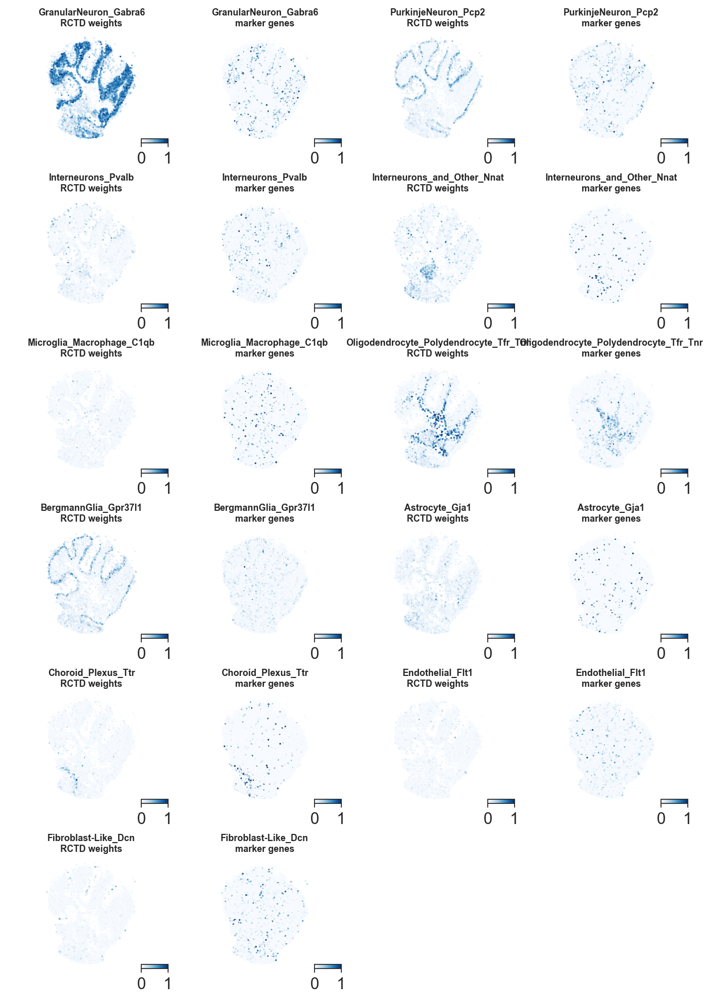

In [20]:
# Plot all markergene sets for scRNA-seq clusters
# -----------------------------------------------

subplot_size = (2,2)
num_cols = 2
num_rows = len(dropviz_dict) // num_cols + 1
figsize_x = (subplot_size[0] * num_cols) * 2.1
figsize_y = subplot_size[1] * num_rows

fig = plt.figure(figsize=(figsize_x, figsize_y), constrained_layout=True)
grid = fig.add_gridspec(ncols=num_cols*2, nrows=num_rows)

for n, layer in enumerate(dropviz_dict):
    
    ax = fig.add_subplot(grid[n // num_cols, 2*(n % num_cols)])
    
    clust_num = dropviz_dict[layer] - 1
    weights = np.array(rctd_weights[:,clust_num]).flatten()
    
    plot_continuous(rctd_coord["x"], rctd_coord["y"], weights, 
                    ax, vmax = 1, title = layer+"\nRCTD weights",
                    spot_size = 0.2,
                   )
    
    if layer in markergenes_dict:

        ax = fig.add_subplot(grid[n // num_cols, 2*(n % num_cols) + 1])
        
        plot_continuous(metagene_df["xcoord"], metagene_df["ycoord"], metagene_df[layer], 
                        ax, vmax = 1, title = layer+"\nmarker genes",
                        spot_size = 0.2,
                       )

#fig.savefig(os.path.join(filepath, "all_metagenes.png"), format='png', dpi=1200)

### Comparison between spatial, nonspatial and RCTD weights

{'GranularNeuron_Gabra6': 1, 'PurkinjeNeuron_Pcp2': 2, 'Interneurons_Pvalb': 3, 'Interneurons_and_Other_Nnat': 4, 'Microglia_Macrophage_C1qb': 5, 'Oligodendrocyte_Polydendrocyte_Tfr_Tnr': 6, 'BergmannGlia_Gpr37l1': 7, 'Astrocyte_Gja1': 8, 'Choroid_Plexus_Ttr': 9, 'Endothelial_Flt1': 10, 'Fibroblast-Like_Dcn': 11}

Generating 4 by 1 grid of plots (figsize = 12, 3.5999999999999996)

Blues
16 scRNAseq DE markers for clusters ('GranularNeuron_Gabra6',)


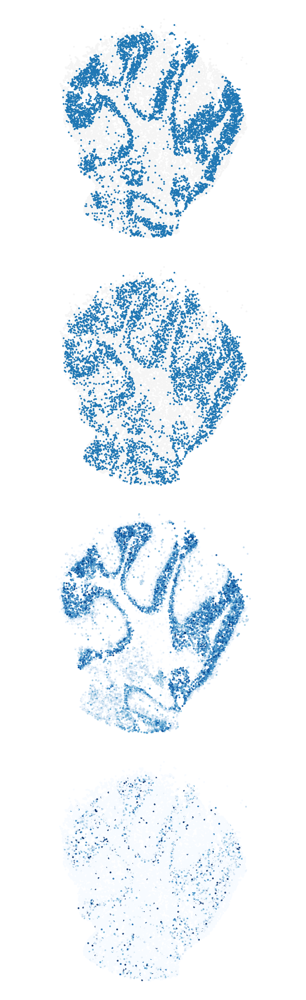

In [21]:
from utils.plotting import plot_cluster_subset

colours_dict_fine = {
    "Granular Layer 1" : "tab:blue",
    "Granular Layer 2" : "tab:blue",
}

cmap_dict = {
    "Granular Layer 1" : "Blues",
    "Granular Layer 2" : "Blues",
}

vmax_dict = {
    "Granular Layer 1" : 1,
    "Granular Layer 2" : 1,
}


# which layers to plot:
# [nonspatial, spatial, RCTD, marker-genes]

print(dropviz_dict)

layers = [
    [("Granular Layer 1", "Granular Layer 2"), 
     ("Granular Layer 1", "Granular Layer 2"),
     ("GranularNeuron_Gabra6",), 
     ("GranularNeuron_Gabra6",)
    ],
]

subplot_size = (3,3)
num_cols = len(layers)
num_rows = 4
figsize_x = (subplot_size[0] * num_cols) * 1.2
figsize_y = subplot_size[1] * num_rows

print(f"\nGenerating {num_rows} by {num_cols} "
      f"grid of plots (figsize = {figsize_y}, {figsize_x})\n")

fig = plt.figure(figsize=(figsize_x, figsize_y),
                 constrained_layout=True)
grid = fig.add_gridspec(ncols=num_cols, nrows=num_rows)

for col, layer in enumerate(layers):
    
    # BANKSY
    # ------
    
    ax = fig.add_subplot(grid[0, col])
    plot_cluster_subset(layer[0], colours_dict_fine, adata_spatial, 
                        ax, umap_name="reduced_pc_16_umap", 
                        spot_size = 0.3, plot_umap=False)  
    
    # non-spatial
    # -----------
    
    ax = fig.add_subplot(grid[1, col])
    plot_cluster_subset(layer[1], colours_dict_fine, adata_nonspatial, 
                        ax, umap_name="reduced_pc_16_umap", 
                        spot_size = 0.3, plot_umap=False)
    
    # Plot scRNAseq metagene (from top DE genes)
    # ------------------------------------------
    
    # choose one of the clusters being plotted
    cluster_to_plot = layer[0][0]
    colormap = cmap_dict[cluster_to_plot]
    vmax = vmax_dict[cluster_to_plot]
    print(colormap)
    
    from scipy.io import mmread
    
    ax = fig.add_subplot(grid[2, col])
    
    weights = np.zeros((len(rctd_coord),))
    
    for dv_clust in layer[2]:
        
        clust_num = dropviz_dict[dv_clust] - 1
        weights += np.array(rctd_weights[:,clust_num]).flatten()

    plot_continuous(rctd_coord.loc[:,"x"], rctd_coord["y"], weights, ax, 
                    cmap = colormap,
                    vmax = vmax, plot_cbar = False, )
        
    
    # Plot scRNAseq metagene (from top DE genes)
    # ------------------------------------------
    
    ax = fig.add_subplot(grid[3, col])

    markers = []
    
    for sc_clust in layer[3]:
        
        markers_temp = [m for m in markergenes_dict[sc_clust] if m in adata_allgenes.var.index]
        
        if markers_temp < markergenes_dict[sc_clust]:
            print(f"{len(markergenes_dict[sc_clust])-len(markers_temp)} "
                  f"scRNA-seq DE genes in {sc_clust} absent/filtered from slideseq dataset")
            
        markers += markers_temp
    
    print(f"{len(markers)} scRNAseq DE markers for clusters {layer[2]}")
    
    layer_slice = adata_allgenes[:, markers]
    metagene = np.mean(layer_slice.X, axis = 1)
    
    plot_continuous(adata_spatial.obs["xcoord"], adata_spatial.obs["ycoord"], metagene, ax, 
                    cmap = colormap,
                    vmax = vmax, plot_cbar = False)
    
fig.savefig(os.path.join(filepath, "subplots_layers_sseqcerebellum_v1.png"), format='png', dpi=1200)
fig.savefig(os.path.join(filepath, "subplots_layers_sseqcerebellum_v1.eps"), format='eps', dpi=1200)

{'GranularNeuron_Gabra6': 1, 'PurkinjeNeuron_Pcp2': 2, 'Interneurons_Pvalb': 3, 'Interneurons_and_Other_Nnat': 4, 'Microglia_Macrophage_C1qb': 5, 'Oligodendrocyte_Polydendrocyte_Tfr_Tnr': 6, 'BergmannGlia_Gpr37l1': 7, 'Astrocyte_Gja1': 8, 'Choroid_Plexus_Ttr': 9, 'Endothelial_Flt1': 10, 'Fibroblast-Like_Dcn': 11}

Generating 4 by 4 grid of plots (figsize = 12, 13.200000000000001)

16 scRNAseq DE markers for clusters ('GranularNeuron_Gabra6',)
229 scRNAseq DE markers for clusters ('PurkinjeNeuron_Pcp2', 'BergmannGlia_Gpr37l1')
75 scRNAseq DE markers for clusters ('Interneurons_Pvalb',)
85 scRNAseq DE markers for clusters ('Oligodendrocyte_Polydendrocyte_Tfr_Tnr',)


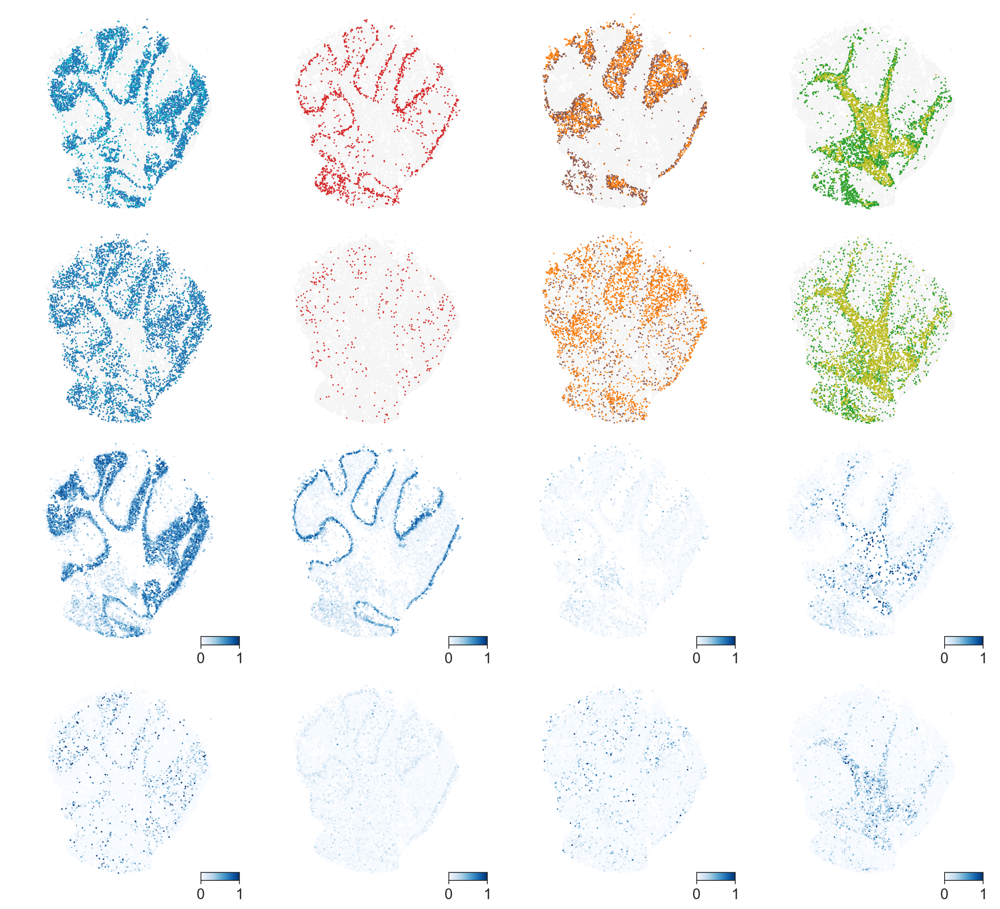

In [22]:
from utils.plotting import plot_cluster_subset

colours_dict_fine = {
    "Granular Layer 1" : "tab:blue",
    "Granular Layer 2" : "tab:cyan",
    "Interneurons Pvalb 1" : "tab:brown",
    "Interneurons Pvalb 2" : "tab:orange",
    "Purkinje/Bergmann" : "tab:red",
    "Oligodendrocyte/Polydendrocyte 1": "tab:green",
    "Oligodendrocyte/Polydendrocyte 2": "tab:olive",
    "Choroid Plexus" : "tab:brown",
    "Fibroblast-like Dcn" : "tab:pink",
    "Astrocytes":"tab:green",
    "Interneurons and other Nnat": "tab:orange",
    "Microglia": "tab:purple",
}

# which layers to plot:
# [nonspatial, spatial, RCTD, marker-genes]

print(dropviz_dict)

layers = [
    [("Granular Layer 1", "Granular Layer 2"), 
     ("Granular Layer 1", "Granular Layer 2"),
     ("GranularNeuron_Gabra6",), 
     ("GranularNeuron_Gabra6",)
    ],
    [("Purkinje/Bergmann",), 
     ("Purkinje/Bergmann",), 
     ("PurkinjeNeuron_Pcp2", "BergmannGlia_Gpr37l1"),
     ("PurkinjeNeuron_Pcp2", "BergmannGlia_Gpr37l1"),
    ],
    [("Interneurons Pvalb 1", "Interneurons Pvalb 2"),
     ("Interneurons Pvalb 1", "Interneurons Pvalb 2"), 
     ("Interneurons_Pvalb",),
     ("Interneurons_Pvalb",)
    ],
#     [("Oligodendrocyte/Polydendrocyte 1"),
#      ("Oligodendrocyte/Polydendrocyte 1"), 
#      ("Oligodendrocyte_Polydendrocyte_Tfr_Tnr",),
#      ("Oligodendrocyte_Polydendrocyte_Tfr_Tnr",)
#     ],
#     [("Oligodendrocyte/Polydendrocyte 2"),
#      ("Oligodendrocyte/Polydendrocyte 2"), 
#      ("Oligodendrocyte_Polydendrocyte_Tfr_Tnr",),
#      ("Oligodendrocyte_Polydendrocyte_Tfr_Tnr",)
#     ],
    [("Oligodendrocyte/Polydendrocyte 1", "Oligodendrocyte/Polydendrocyte 2"),
     ("Oligodendrocyte/Polydendrocyte 1", "Oligodendrocyte/Polydendrocyte 2"), 
     ("Oligodendrocyte_Polydendrocyte_Tfr_Tnr",),
     ("Oligodendrocyte_Polydendrocyte_Tfr_Tnr",)
    ],
#     [("Choroid Plexus",),
#      ("Choroid Plexus",), 
#      ("Choroid_Plexus_Ttr",),
#      ("Choroid_Plexus_Ttr",)
#     ],
]

subplot_size = (3,3)
num_cols = len(layers)
num_rows = 4
figsize_x = (subplot_size[0] * num_cols) * 1.1
figsize_y = subplot_size[1] * num_rows

print(f"\nGenerating {num_rows} by {num_cols} "
      f"grid of plots (figsize = {figsize_y}, {figsize_x})\n")

fig = plt.figure(figsize=(figsize_x, figsize_y),
                 constrained_layout=True)
grid = fig.add_gridspec(ncols=num_cols, nrows=num_rows)

for col, layer in enumerate(layers):
    
    # BANKSY
    # ------
    
    ax = fig.add_subplot(grid[0, col])
    plot_cluster_subset(layer[0], colours_dict_fine, adata_spatial, 
                        ax, umap_name="reduced_pc_16_umap", 
                        spot_size=0.2, plot_umap=False)  
    
    # non-spatial
    # -----------
    
    ax = fig.add_subplot(grid[1, col])
    plot_cluster_subset(layer[1], colours_dict_fine, adata_nonspatial, 
                        ax, umap_name="reduced_pc_16_umap", 
                        spot_size=0.2, plot_umap=False)
    
    # Plot scRNAseq metagene (from top DE genes)
    # ------------------------------------------
    
    from scipy.io import mmread
    
    ax = fig.add_subplot(grid[2, col])
    
    weights = np.zeros((len(rctd_coord),))
    
    for dv_clust in layer[2]:
        
        clust_num = dropviz_dict[dv_clust] - 1
        weights += np.array(rctd_weights[:,clust_num]).flatten()
        
    plot_continuous(rctd_coord.loc[:,"x"], rctd_coord["y"], weights, 
                    ax, vmax = 1, plot_cbar = True)
        
    
    # Plot scRNAseq metagene (from top DE genes)
    # ------------------------------------------
    
    ax = fig.add_subplot(grid[3, col])

    markers = []
    
    for sc_clust in layer[3]:
        
        markers_temp = [m for m in markergenes_dict[sc_clust] if m in adata_allgenes.var.index]
        
        if markers_temp < markergenes_dict[sc_clust]:
            print(f"{len(markergenes_dict[sc_clust])-len(markers_temp)} "
                  f"scRNA-seq DE genes in {sc_clust} absent/filtered from slideseq dataset")
            
        markers += markers_temp
    
    print(f"{len(markers)} scRNAseq DE markers for clusters {layer[2]}")
    
    layer_slice = adata_allgenes[:, markers]
    metagene = np.mean(layer_slice.X, axis = 1)
    
    plot_continuous(adata_spatial.obs["xcoord"], adata_spatial.obs["ycoord"], metagene, 
                    ax, vmax = 1, plot_cbar = True)
    
fig.savefig(os.path.join(filepath, "subplots_otherlayers_sseqcerebellum_v1.png"), format='png', dpi=1200)
fig.savefig(os.path.join(filepath, "subplots_otherlayers_sseqcerebellum_v1.eps"), format='eps', dpi=1200)

## Plot Self vs neighbour metagene



In [23]:
adata_spatial.uns["rank_genes_groups"]
adata_spatial

AnnData object with n_obs × n_vars = 22128 × 4000
    obs: 'xcoord', 'ycoord', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_counts', 'labels_s-1_pc16_nc0.20_r0.60', 'cell type', 'cell type refined'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'is_nbr'
    uns: 'rank_genes_groups', 'dendrogram_cell type', 'cell type_colors'
    obsm: 'reduced_pc_16', 'reduced_pc_16_umap', 'coord_xy', 'X_pca'

Top 20 DE genes for Granular Layer : ['Pfdn5', 'Pcsk1n', 'Lars2', 'Ndufa7', 'Zfp706', 'Zfr', 'Gas5', 'Ppp1r11', 'Lamtor2', 'Hcfc1r1', 'Dnajc8', 'Arpp19', 'Atox1', 'Mrpl42', 'Ranbp1', 'Unc13c', 'Rad21', 'Rpl27a', 'Sdha', 'Ccdc85b']

Top 20 DE genes for Interneurons Pvalb : ['mt-Rnr2', 'Pcp2', 'mt-Nd2', 'S100b', 'Gpm6b', 'Itpr1', 'mt-Tv', 'Metrn', 'Gria1', 'mt-Ta', 'Fam213a', 'Fam107a', 'Sbk1', 'Rgs8', 'Camk2n1', 'Fxyd1', 'mt-Ti', 'Ppp1r16b', 'Cspg4', 'mt-Tf']

Comparing <Granular Layer> with:
['Interneurons Pvalb', 'Oligodendrocyte/Polydendrocyte', 'Purkinje/Bergmann', 'RBC']
Top 20 DE genes for Granular Layer : ['Pfdn5', 'Pcsk1n', 'Lars2', 'Ndufa7', 'Zfp706', 'Zfr', 'Gas5', 'Ppp1r11', 'Lamtor2', 'Hcfc1r1', 'Dnajc8', 'Arpp19', 'Atox1', 'Mrpl42', 'Ranbp1', 'Unc13c', 'Rad21', 'Rpl27a', 'Sdha', 'Ccdc85b']

3 2


C:\Users\chousn\AppData\Local\Temp/ipykernel_45664/1931847050.py:188: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  fig2.tight_layout()
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


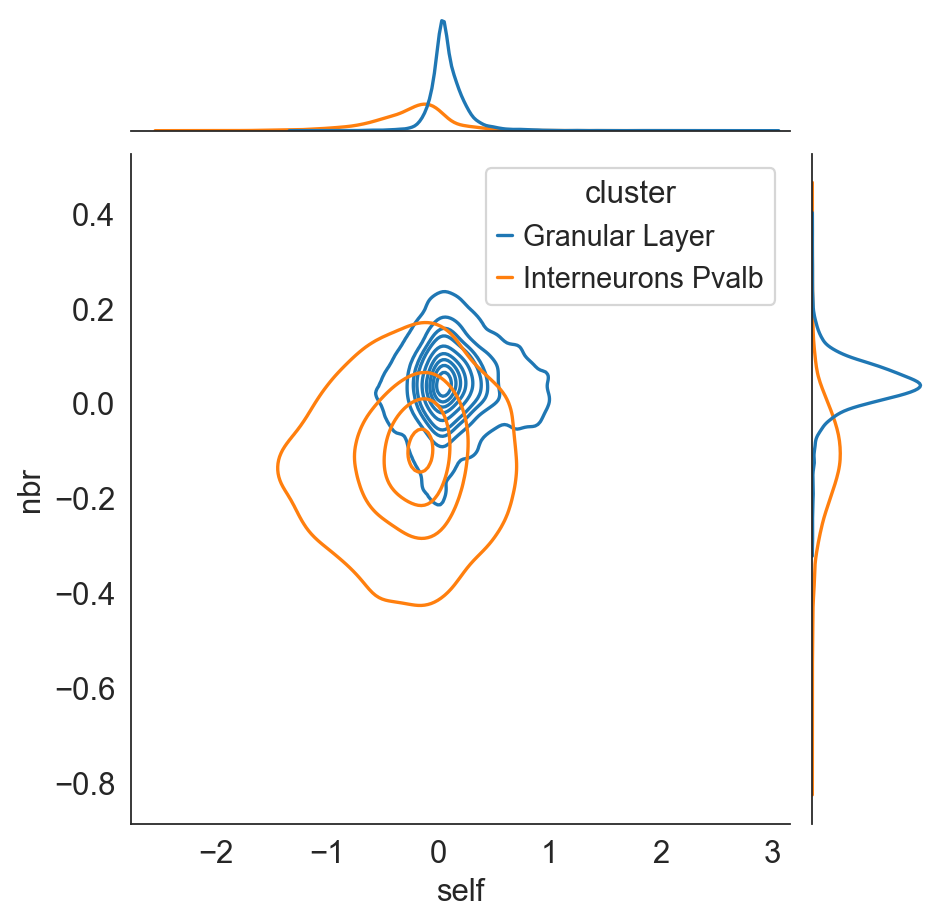

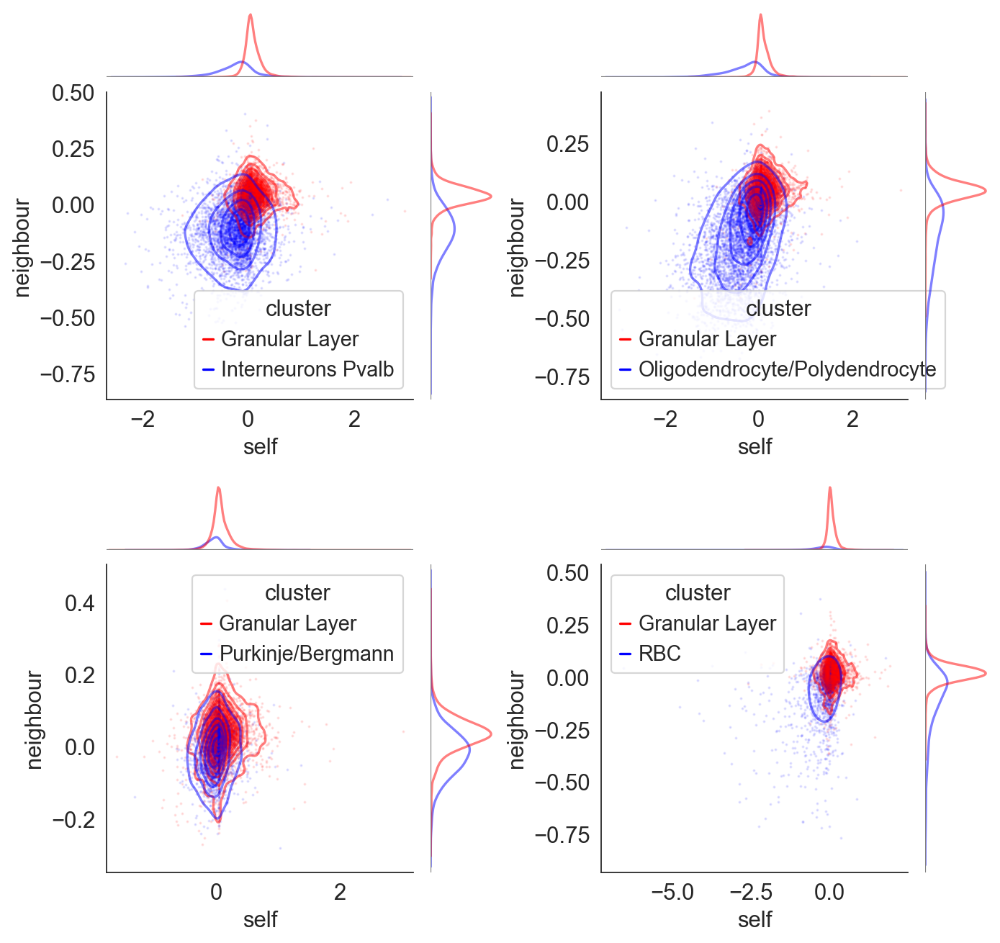

In [27]:
def get_DEgenes(adata, cell_type, top_n=20, verbose=True):
    DE_genes = sc.get.rank_genes_groups_df(adata, group=cell_type)["names"][:top_n].tolist()
    if verbose: print(f"Top {top_n} DE genes for {cell_type} : {DE_genes}\n")
    return DE_genes

def get_metagene_difference(adata, DE_genes1, DE_genes2):
    """
    Compute the differences in metagene and neighbour metagene
    espression for a particular cell type
    must have run scanpy's rank_genes_groups first
    """
    
    def get_metagene(DE_genes):

        genes_slice = adata[:, DE_genes]
        genes_slice_nbr = adata[:, [gene + "_nbr" for gene in DE_genes]]

        metagene = np.mean(genes_slice.X, axis = 1)
        metagene_nbr = np.mean(genes_slice_nbr.X, axis = 1)
        
        return metagene, metagene_nbr
    
    metagene1, metagene_nbr1 = get_metagene(DE_genes1)
    metagene2, metagene_nbr2 = get_metagene(DE_genes2)
    
    return metagene1-metagene2, metagene_nbr1-metagene_nbr2


from matplotlib.lines import Line2D

# Plot just the granular layer
# ----------------------------

nbr_contribution = 0.2

top_n = 20
cell_type = "Granular Layer"
cell_type2 = "Oligodendrocyte/Polydendrocyte"
cell_type2 = "Interneurons Pvalb"

DE_genes1 = get_DEgenes(adata_self, cell_type, top_n = top_n)
DE_genes2 = get_DEgenes(adata_self, cell_type2, top_n = top_n)
metagene, metagene_nbr = get_metagene_difference(adata_spatial, DE_genes1, DE_genes2)

mask_1 = adata_spatial.obs["cell type refined"] == cell_type
mask_2 = adata_spatial.obs["cell type refined"] == cell_type2

# fig, ax = plt.subplots(figsize=(4, 4), constrained_layout=True)

dfs = []

for mask, colour, cluster in [(mask_1,"red",cell_type),(mask_2,"blue",cell_type2)]:
    
    self_expr = np.sqrt(1-nbr_contribution) * metagene[mask]
    nbr_expr = np.sqrt(nbr_contribution) * metagene_nbr[mask]
    
#     metagene_plot = ax.scatter(self_expr, nbr_expr, c=colour, s=.5, alpha=.2)
    dfs.append(pd.DataFrame(data={'self': self_expr, 'nbr': nbr_expr, "cluster":cluster}))

df_combined = pd.concat(dfs, ignore_index=True)
# df_combined["cluster"] = df_combined["cluster"].astype("category")
# display(df_combined.dtypes)
    
ax.set_aspect('equal',)
# ax.set_title(f'Granular layer', fontsize=20, fontweight="bold",)
ax.set_ylim([None,1.5])
ax.set_xlim([None,1.5])
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

sns.jointplot(data=df_combined, x="self", y="nbr", hue="cluster", kind="kde",
             joint_kws = {"thresh":0.03,"levels":10, "bw_adjust":1.5, "fill":False})

# fig, ax = plt.subplots()
# sns.kdeplot(data=df_combined, x="self", hue="cluster", palette = ["red","blue"], 
#             alpha=0.5, linewidth = 0.1, common_norm = False, common_grid=True,
#             multiple="stack", ax=ax)

#plt.gcf().savefig("metagene_nbr_plot.eps", format='eps', dpi=1200)

# Plot all clusters vs one cluster
# --------------------------------

cell_type = "Granular Layer"
cell_types = [cluster for cluster in adata_self.obs["cell type refined"].cat.categories 
              if cluster != cell_type
             ]
print(f"Comparing <{cell_type}> with:\n{cell_types}")

DE_genes1 = get_DEgenes(adata_self, cell_type, top_n = top_n)

# DE_genes = sc.get.rank_genes_groups_df(adata_self, group=cell_type)["names"][:top_n].tolist()
# print(f"Top {top_n} DE genes for {cell_type} : {DE_genes}\n")

# genes_slice = adata_spatial[:, DE_genes]
# genes_slice_nbr = adata_spatial[:, [gene + "_nbr" for gene in DE_genes]]

# metagene = np.mean(genes_slice.X, axis = 1)
# metagene_nbr = np.mean(genes_slice_nbr.X, axis = 1)

mask_1 = adata_spatial.obs["cell type refined"] == cell_type

subplot_size = (4,4)
num_cols = 2
num_rows = len(cell_types) // num_cols + 1
print(num_rows,num_cols)
figsize_x = (subplot_size[0] * num_cols) * 1.1
figsize_y = subplot_size[1] * num_rows

fig2 = plt.figure(figsize=(figsize_x, figsize_y), constrained_layout=True)
grid = fig2.add_gridspec(ncols=num_cols, nrows=num_rows)


for n, cell_type2 in enumerate(cell_types):
    
    #ax = fig2.add_subplot(grid[n//num_cols, n%num_cols])
    subgrid = grid[n//num_cols, n%num_cols].subgridspec(5, 5)
    ax = fig2.add_subplot(subgrid[1:,:-1])
    
    DE_genes2 = get_DEgenes(adata_self, cell_type2, top_n = top_n, verbose=False)
    metagene, metagene_nbr = get_metagene_difference(adata_spatial, DE_genes1, DE_genes2)

    mask_2 = adata_spatial.obs["cell type refined"] == cell_type2
    
    dfs = [] #used for seaborn plot
    
    min_x, max_x = 0.0, 0.0
    
    for mask,colour,cluster in [(mask_1,"red",cell_type),(mask_2,"blue",cell_type2),]:

        self_expr = np.sqrt(1-nbr_contribution) * metagene[mask]
        nbr_expr = np.sqrt(nbr_contribution) * metagene_nbr[mask]
        metagene_plot = ax.scatter(self_expr, nbr_expr, c=colour, s=.6, alpha=0.1, label=cluster)
        
        dfs.append(pd.DataFrame(data={'self': self_expr, 'nbr': nbr_expr, "cluster":cluster}))
        
        min_x = min(np.amin(self_expr),min_x)
        max_x = max(np.amax(self_expr),max_x)
        
    df_combined = pd.concat(dfs, ignore_index=True)
    
    sns.kdeplot(
        data=df_combined, x="self", y="nbr", hue="cluster", palette = ["red","blue"], 
        alpha=0.5, #common_norm = False, #common_grid=True,
        bw_adjust=1.2, thresh=0.05, levels = 12,
        #multiple="stack", 
        ax=ax,
    )

    #ax.set_xlim([min_x, max_x])
    #ax.set_ylim([min_x, max_x])
    ax.set_xlabel("self")
    ax.set_ylabel("neighbour")
    #ax.set_title(f"{cell_type_2} vs\n{cell_type}", fontsize=8)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    
    ax_top = fig2.add_subplot(subgrid[:1,:-1], sharex=ax)
    sns.kdeplot(data=df_combined, x="self", hue="cluster", palette = ["red","blue"], 
                alpha=0.5, common_norm = True, #linewidth = 0.2, #common_grid=True,
                bw_adjust=1.2, legend = False,
                #multiple="stack", 
                ax=ax_top)
    #ax_top.legend().set_visible(False)
    ax_top.axis("off")
    xmin, xmax = ax_top.get_xaxis().get_view_interval()
    ymin, _ = ax_top.get_yaxis().get_view_interval()
    ax_top.add_artist(Line2D((xmin, xmax), (ymin, ymin), color='gray', linewidth=1,))
    
    ax_right = fig2.add_subplot(subgrid[1:,-1:], sharey=ax)
    sns.kdeplot(data=df_combined, y="nbr", hue="cluster", palette = ["red","blue"], 
                alpha=0.5, common_norm = False,  #linewidth = 0.2, #common_grid=True,
                bw_adjust=1.2, legend = False,
                #multiple="stack", 
                ax=ax_right)
    #ax_right.legend().set_visible(False)
    ax_right.axis("off")
    xmin, _ = ax_right.get_xaxis().get_view_interval()
    ymin, ymax = ax_right.get_yaxis().get_view_interval()
    ax_right.add_artist(Line2D((xmin, xmin), (ymin, ymax), color='gray', linewidth=1,))
    
#     ax.legend(fontsize = "xx-small", markerscale = 10.0, frameon=True,
#               bbox_to_anchor=(1,1), loc="upper right",
#               facecolor="whitesmoke", edgecolor=None)
    
#     ax.set_aspect('equal',)

fig2.tight_layout()
fig2.savefig("metagene_nbr_plot_supp.eps", format='eps', dpi=1200)
#fig2.savefig("metagene_nbr_plot_supp.png", format='png', dpi=1200)

All refined cell types: Index(['Granular Layer', 'Interneurons Pvalb',
       'Oligodendrocyte/Polydendrocyte', 'Purkinje/Bergmann', 'RBC', 'other'],
      dtype='object')


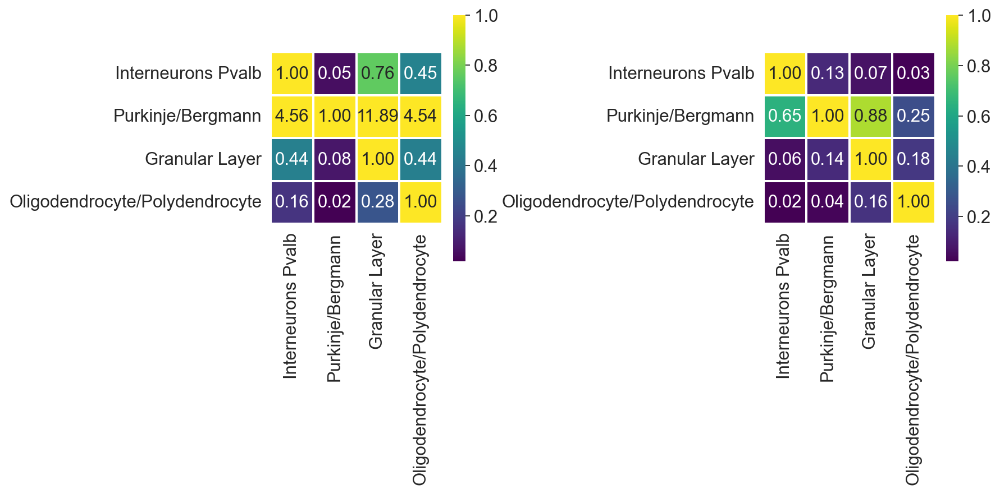

In [25]:
print(f"All refined cell types: {adata_spatial.obs['cell type refined'].cat.categories}")

cell_types = [
    "Interneurons Pvalb", 
    "Purkinje/Bergmann", 
    "Granular Layer",
    "Oligodendrocyte/Polydendrocyte", 
]

fig, axs = plt.subplots(nrows = 1, ncols = 2, 
                        figsize=(len(cell_types)*2.8, len(cell_types)*1.4))

connection_grids = []

max_nondiag = 0.0

for adata in [adata_nonspatial, adata_spatial]:
    
    one_hots = []
    for cell_type in cell_types:
        one_hots.append(np.array(adata.obs["cell type refined"]==cell_type))
    
    # one hot labels
    # --------------
    one_hot_array = np.stack(one_hots, axis = 0)
    #print(one_hot_array.shape, one_hot_array.dtype)
    
    # adjacency matrix
    # ----------------
    weights = processing_dict[-1]["weights"].copy()
    weights.data = np.ones_like(weights.data)
    #print(weights.data, weights.shape)
    
    # Unnormalized summed connections
    # -------------------------------
    connection_grid = one_hot_array @ weights @ one_hot_array.T
    #print(connection_grid)
    
    # Normalize
    # ---------
    connection_grid /= np.diag(connection_grid)[:,np.newaxis]
    #print(connection_grid)

    connection_grids.append(connection_grid)
    
    # find max non-diagonal by zeroing out diagonal values (all diagonals = 1)
    connections_zerod = connection_grid.copy()
    np.fill_diagonal(connections_zerod, 0)
    max_nondiag = max(max_nondiag, np.amax(connections_zerod))

for n, connection_grid in enumerate(connection_grids):
    
    heat_map = sns.heatmap(connection_grid, linewidth = 1 , 
                           #vmax = max_nondiag,
                           vmax = 1,
                           cmap = "viridis", annot = True, fmt="0.2f",
                           yticklabels=cell_types, xticklabels=cell_types, 
                           square=True, ax=axs[n])
    
fig.tight_layout()
fig.savefig(os.path.join(filepath, "connections.eps"), format='eps', dpi=1200)

### Compare major cell types to RCTD

Number of cells in both RCTD and adata: 9850
Comparing to RCTD


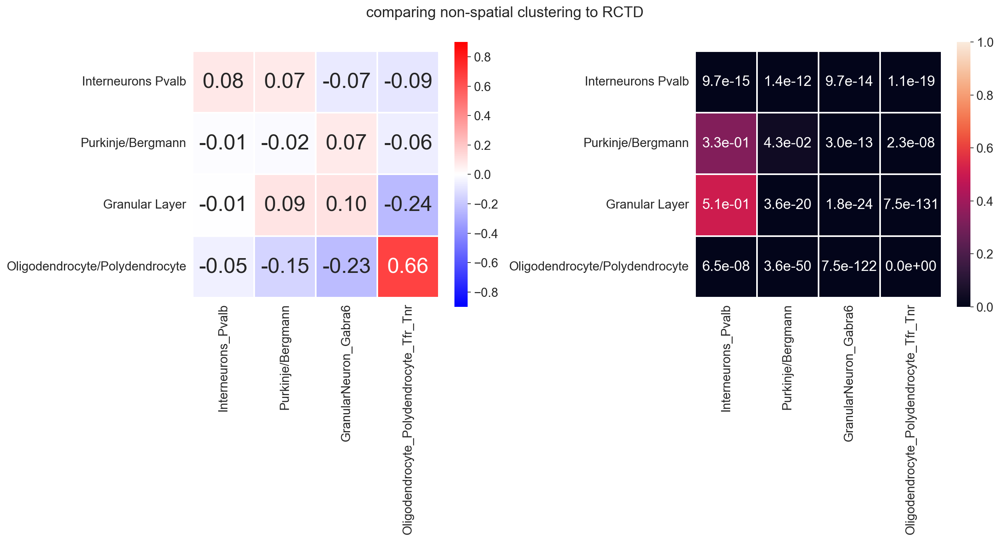

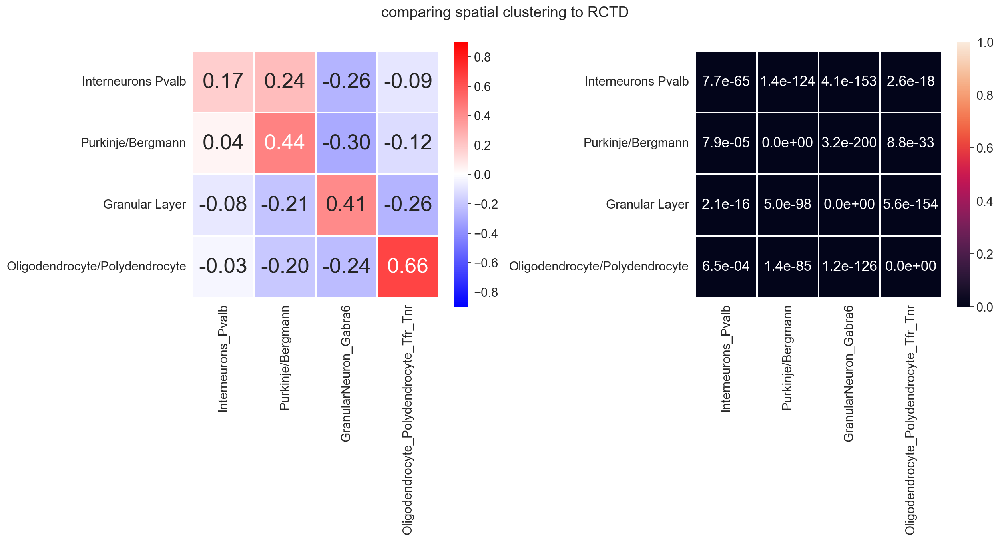

In [26]:
from scipy.stats import pearsonr, pointbiserialr

# join the dataframes to get the intersection of cells from RCTD and unsupervised clustering
df_intersect = rctd_coord.join(adata_spatial.obs, how="inner")
print(f"Number of cells in both RCTD and adata: {len(df_intersect)}")

rctd_df = rctd_coord.copy()
for cell_type in dropviz_dict:
    col_num = dropviz_dict[cell_type] - 1 # column in weights matrix this cell type corresponds to
    rctd_df[cell_type] = rctd_weights[:,col_num]

# combine Purkinje and Bergmann weights
for df in [rctd_df, metagene_df]:
    df["Purkinje/Bergmann"] = df["PurkinjeNeuron_Pcp2"] + df["BergmannGlia_Gpr37l1"]

rctd_df = rctd_df.loc[df_intersect.index,:]
# display(rctd_df)

metagene_df_intersect = metagene_df.loc[df_intersect.index,:]

adata_spatial_rctd = adata_spatial[df_intersect.index,:]
adata_nonspatial_rctd = adata_nonspatial[df_intersect.index,:]
# display(adata_spatial_rctd, adata_nonspatial_rctd)

# reference = list(dropviz_dict.keys())
reference = [
    "Interneurons_Pvalb",
    "Purkinje/Bergmann",
    "GranularNeuron_Gabra6",
    "Oligodendrocyte_Polydendrocyte_Tfr_Tnr",
]

cell_types = [
    "Interneurons Pvalb",
    "Purkinje/Bergmann",
    "Granular Layer",
    "Oligodendrocyte/Polydendrocyte",
]

for comparison_df, s in [(rctd_df, "RCTD"),]:

    print(f"Comparing to {s}")

    for adata, s2 in [(adata_nonspatial_rctd, "non-spatial"), (adata_spatial_rctd, "spatial")]:

        correlation_grid = np.zeros((len(cell_types),len(reference)),)
        pval_grid = np.zeros_like(correlation_grid)

        for col, ref in enumerate(reference):
            for row, compare in enumerate(cell_types):

                mask = (adata.obs["cell type refined"] == compare).astype(float).values

                r, pval = pointbiserialr(mask, comparison_df.loc[:,ref].values)
                #print(f"Pearson correlation of {compare} to {ref} : r = {r:0.3f}, p-value = {pval:0.3f}")

                correlation_grid[row,col] = r
                pval_grid[row,col] = pval

        fig, axs = plt.subplots(nrows = 1, ncols = 2, 
                                figsize=((len(reference)*4)*1.0, len(cell_types)*2))
        heat_map = sns.heatmap(correlation_grid, linewidth = 1 , 
                               vmin = -.9, vmax = .9, cmap = "bwr", 
                               annot = True, fmt="0.2f",
                               yticklabels=cell_types, xticklabels=reference, 
                               square=True, ax=axs[0],
                              annot_kws={"size": 24})
        pvals = sns.heatmap(pval_grid, linewidth = 1 , 
                            vmin = 0, vmax = 1, #cmap = "bwr", 
                            annot = True, fmt="0.1e",
                            yticklabels=cell_types, xticklabels=reference, 
                            square=True, ax = axs[1],
                           annot_kws={"size": 16})
        fig.suptitle(f"comparing {s2} clustering to {s}")
        fig.tight_layout()
        
        fig.savefig(os.path.join(filepath, f"correlation_plot_{s}_{s2}.eps"), format='eps', dpi=1200)